In [1]:
from math import ceil

import numpy as np
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
from pandas import DataFrame, Timestamp, options
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.stattools import acf

# Suppress chained assignment warnings
options.mode.chained_assignment = None

from icefreearcticml.constants import (
    MODELS,
    MODEL_COLOURS,
    MULTI_LIANG_RES_NAMES,
    VARIABLES as VAR_NAMES,
    VAR_YLABELS,
    VAR_YLABELS_SHORT,
)
from icefreearcticml.liangindex import compute_liang
from icefreearcticml.utils import (
    calculate_bias,
    calculate_combined_pvalues,
    calculate_correlation_ensemble_mean,
    calculate_ensemble_max,
    calculate_ensemble_mean,
    calculate_ensemble_min,
    calculate_first_icefree_year,
    calculate_liang_model_flows,
    calculate_tau_avg,
    filter_by_years,
    get_shape_df,
    plot_variable,
    prepare_for_liang,
    read_model_data_all,
    subtract_ensemble_mean,
)

MODEL_NAMES = MODELS[:-1]   # Exclude 'Observations' from the model names
VARIABLES_ = VAR_NAMES[:-2] # Exclude swfd and lwfd

In [2]:
model_data = read_model_data_all()

In [3]:
# Calculate the average of all model ensembles 
model_ensemble_avgs = {
    var: {
        model: calculate_ensemble_mean(model_data[var][model]) for model in MODEL_NAMES
    } for var in VARIABLES_
}

# Date strings must have the format "YYYY-MM-DD"
bias_start = "1980-01-01"
bias_end = "2014-01-01"

# Calculate the biases using the model ensemble averages
model_ensemble_avg_biases = {
    var: {
        model: calculate_bias(model_data[var]["Observations"], model_ensemble_avgs[var][model], bias_start, bias_end)
        for model in MODEL_NAMES
    } for var in VARIABLES_
}

# Calculate the biases of all the model ensembles
model_ensemble_biases = {
    var: {
        model: calculate_bias(model_data[var]["Observations"], model_data[var][model], bias_start, bias_end)
        for model in MODEL_NAMES
    } for var in VARIABLES_
}

observations = {var: model_data[var]['Observations'] for var in VAR_NAMES}



# Calculate the first icefree year based on SSIE for each model ensemble average
model_ensemble_avg_icefree_years = {
    model: calculate_first_icefree_year(model_ensemble_avgs["ssie"][model])
    for model in MODEL_NAMES
}

# Calculate the first icefree year based on SSIE for each of the model ensembles
model_ensemble_icefree_years = {
    model: calculate_first_icefree_year(model_data["ssie"][model])
    for model in MODEL_NAMES
}

## Exploration

In [4]:
shapes_df = get_shape_df(model_data)
shapes_df

,EC-Earth3,CESM2,MPI-ESM1-2-LR,CanESM5,ACCESS-ESM1-5,Observations
ssie,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(45,)"
wsie,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(45,)"
wsiv,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(45,)"
tas,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(54,)"
oht_atl,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(40,)"
oht_pac,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(40,)"
swfd,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(23,)"
lwfd,"(131, 50)","(131, 50)","(131, 30)","(131, 49)","(131, 40)","(23,)"


<div lang="fr" style="display: none">
<p>Dans cette tableau, on voit les dimension de chaque jeu de données par modèle et variable. Les jeu de données d'observations sont unidimensionnels, et ils sont des périodes d'observations différentes. Tous les jeux de données des modèles sont bidimensionnels ; ils ont tous la même dimension temporelle (chacun a 131 pas de temps), mais ils différent par rapport au nombre d'ensembles. La plupart en ont 50 ; cependant, MPI-ESM1-2-LR en a 30, et ACCESS-ESM1-5 en a 40. En plus, pour les variables d'OHT, CanESM5 a 49 ensembles.<p>
</div>

<div lang="en">
<p>Here we can see the shapes for each of the datasets by model and variable. The observations datasets are 1D and have different observational periods. All model datasets are 2D, consistent across the time dimension (each has 131 time steps), but varying across the number of ensembles. Most have 50 ensembles; however, MPI-ESM1-2-LR has 30 and ACCESS-ESM1-5 has 40. In addition, CanESM5 has 49 ensembles for the OHT variables.</p>
</div>

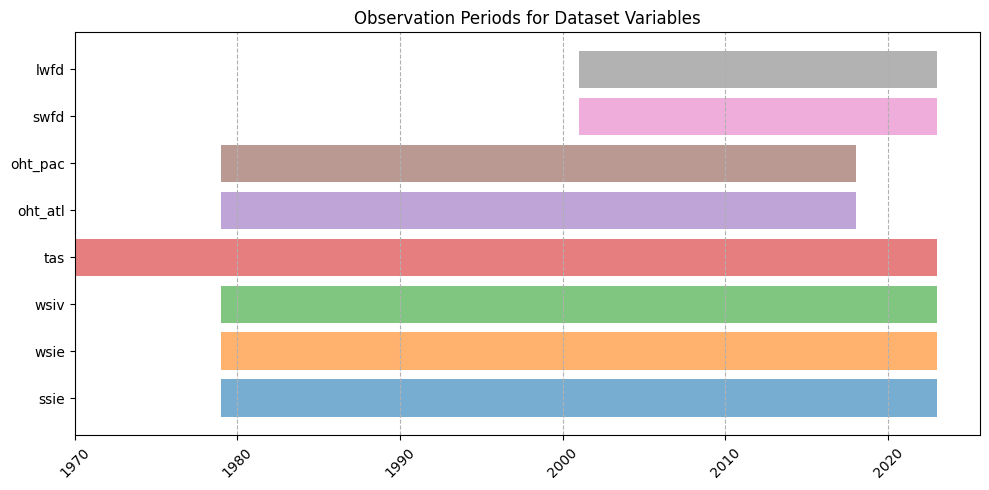

In [5]:
fig, ax = plt.subplots(figsize=(10, 5))

for i, (var, obs_series) in enumerate(observations.items()):
    start = obs_series.index[0]
    end = obs_series.index[-1] 
    ax.barh(var, width=(end - start).days, left=start, alpha=0.6, label=var)

ax.xaxis.set_major_locator(mdates.YearLocator(10))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
plt.xticks(rotation=45)

plt.grid(axis="x", linestyle="--")
plt.title("Observation Periods for Dataset Variables")
plt.tight_layout()
plt.show()

This graph shows the different time periods for each observational dataset. Temperature has the longest period, spanning over 50 years. LWFD and SWFD have the shortest, as they both begin in 2001 and are just over 20 years long. All other variables start in 1979 and have a period of about 40 years.

<div style="display: none">Ce graphique-ci présente les périodes différentes pour chaque jeu de données d'observation. Le température a la période la plus longue, s'étendant sur plus de 50 ans. LWFD et SWFD ont les périodes les plus courtes, étant donné qu'ils commencent tous les deux en 2001 avec une longeur de plus 20 ans. Toutes les autres variables comment en 1979 pour une période d'environ 40 ans.</div>

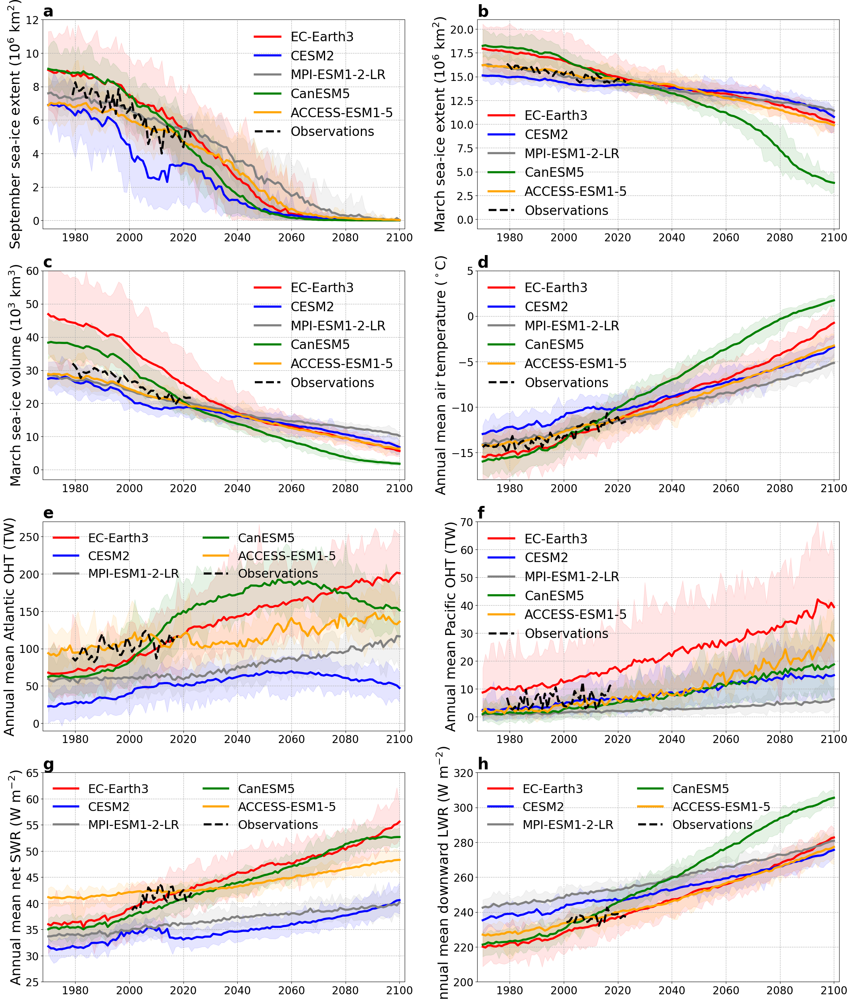

In [6]:
fig,axes = plt.subplots(4,2,figsize=(24,28))
for i, ax in enumerate(axes.flatten()):
    var = VAR_NAMES[i]
    plot_variable(ax, var, model_data[var], VAR_YLABELS[var], i)

fig.subplots_adjust(left=0.08,bottom=0.05,right=0.95,top=0.95,hspace=0.2,wspace=0.2)

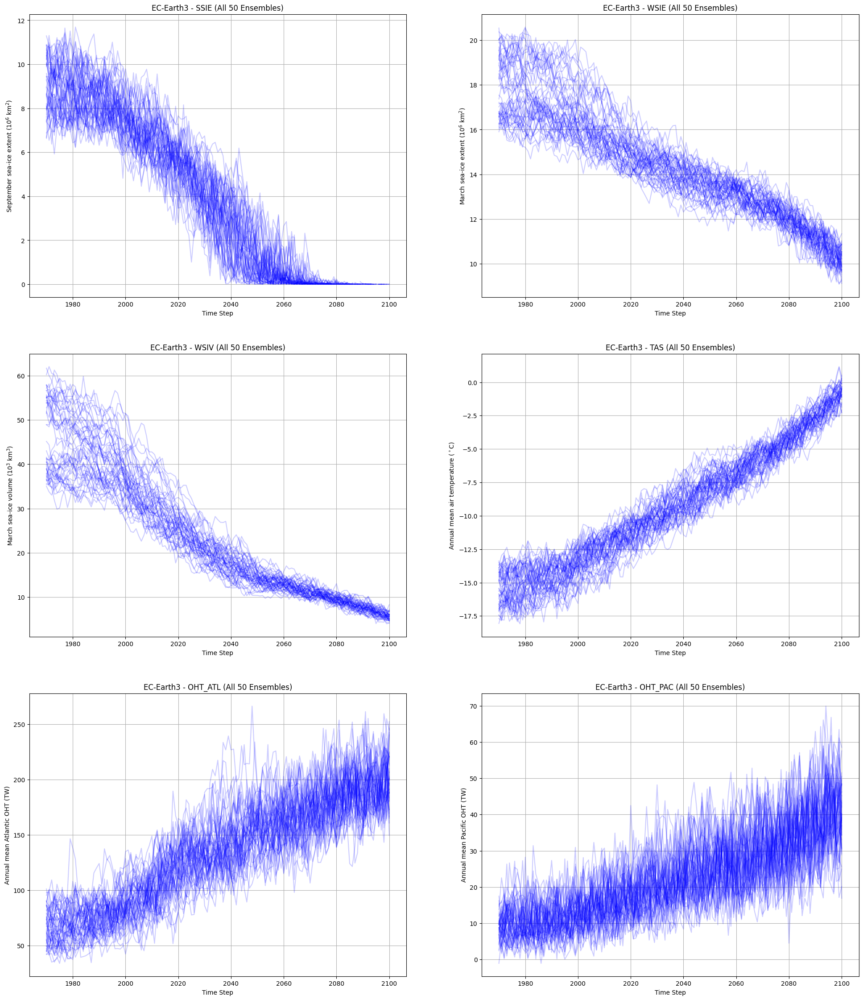

In [17]:
plot_rows = ceil(len(VARIABLES_) / 2)

model = "EC-Earth3" # EC-Earth3, CESM2, MPI-ESM1-2-LR, CanESM5, ACCESS-ESM1-5

fig, axes = plt.subplots(nrows=plot_rows, ncols=2, figsize=(24, 28))
for i, ax in enumerate(axes.flat):
    var = VARIABLES_[i] 
    data = model_data[var][model]
    ax.plot(data, color="blue", alpha=0.2)

    ax.set_title(f"{model} - {var.upper()} (All {data.shape[1]} Ensembles)")
    ax.set_xlabel("Time Step")
    ax.set_ylabel(VAR_YLABELS[var])
    ax.grid(True)

plt.show()

The purpose behind this graph is to examine the distribution of different ensemble realisations for variables of a given model. We wanted to see how the ensembles are distributed between the minimum and maximum, and we note that they are generally distributed uniformly between the extremes. For some models, the spread of the extremes is particularly narrower than others; CanESM5 is notably narrow for both variables, and CESM2 shows a reduced spread for WSIE. In contrast, EC-Earth3 has a fairly wide spread of the extremes. In any case, all models have a tendency to display a small spread around 2100.

<div style="display: none">
L'idée de ce graphique est d'examiner la distribution des réalisations d'ensemble différentes pour les variables d'un modèle donné. On voulait voir comment les ensembles sont distribués entre le minimum et le maximum. On note que les enembles différents pour une variable donnée sont généralement distribués de manière uniforme entre le max et le min. Pour certains modèles, l'écart des extrêmes est particulièrement plus étroit que d'autres ; CanESM5 est notamment étroit pour les deux variables, et CESM2 montre un écart réduit pour WSIE. En revanche, EC-Earth3 présente une différence des extrêmes assez large. En tout cas, tous les modèles a une tendance de converger vers 2100.
</div>

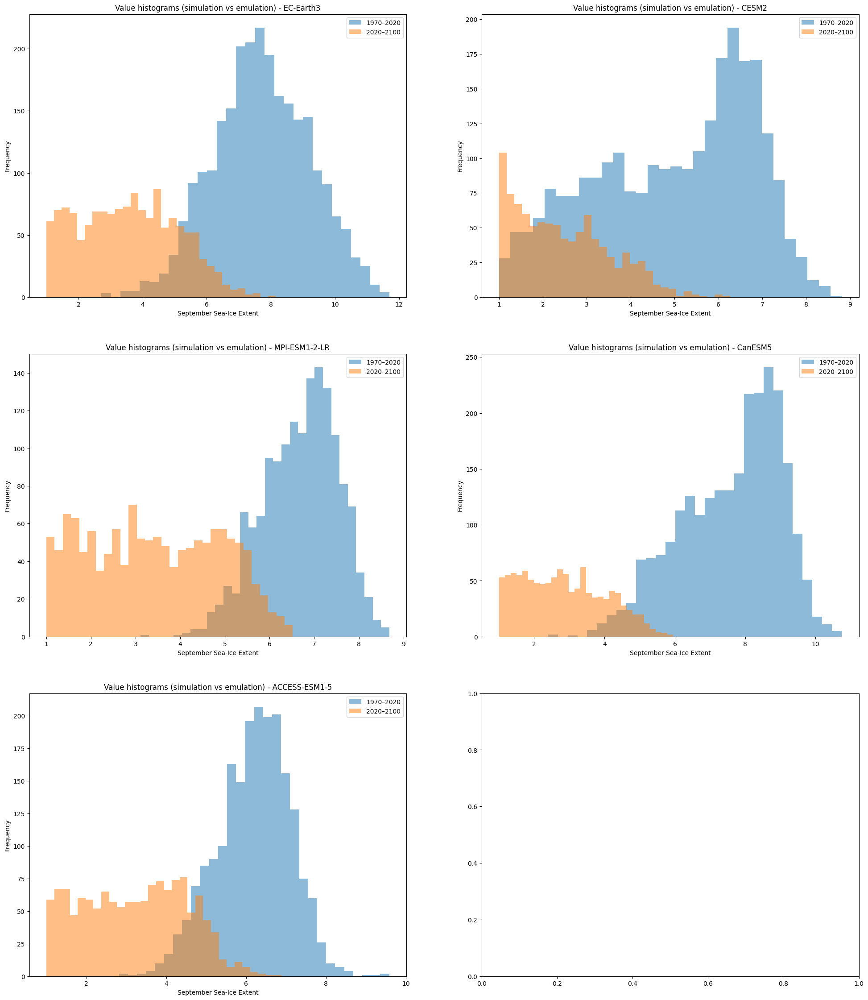

In [53]:

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(24, 28))
axes = axes.flatten()

emu_year_start = "2020-01-01"

for i, model_name in enumerate(MODEL_NAMES):
    ax = axes[i]

    data = model_data["ssie"][model_name]
    data = data[data > 1]

    mask_sim = (data.index <= emu_year_start)
    mask_emu = (data.index > emu_year_start)

    data_sim = data.iloc[mask_sim].stack()
    data_emu = data.iloc[mask_emu].stack()

    ax.hist(data_sim, bins=30, alpha=0.5, label="1970–2020")
    ax.hist(data_emu, bins=30, alpha=0.5, label="2020–2100")
    ax.set_xlabel("September Sea-Ice Extent")
    ax.set_ylabel("Frequency")
    ax.legend()
    ax.set_title(f"Value histograms (simulation vs emulation) - {model_name}")


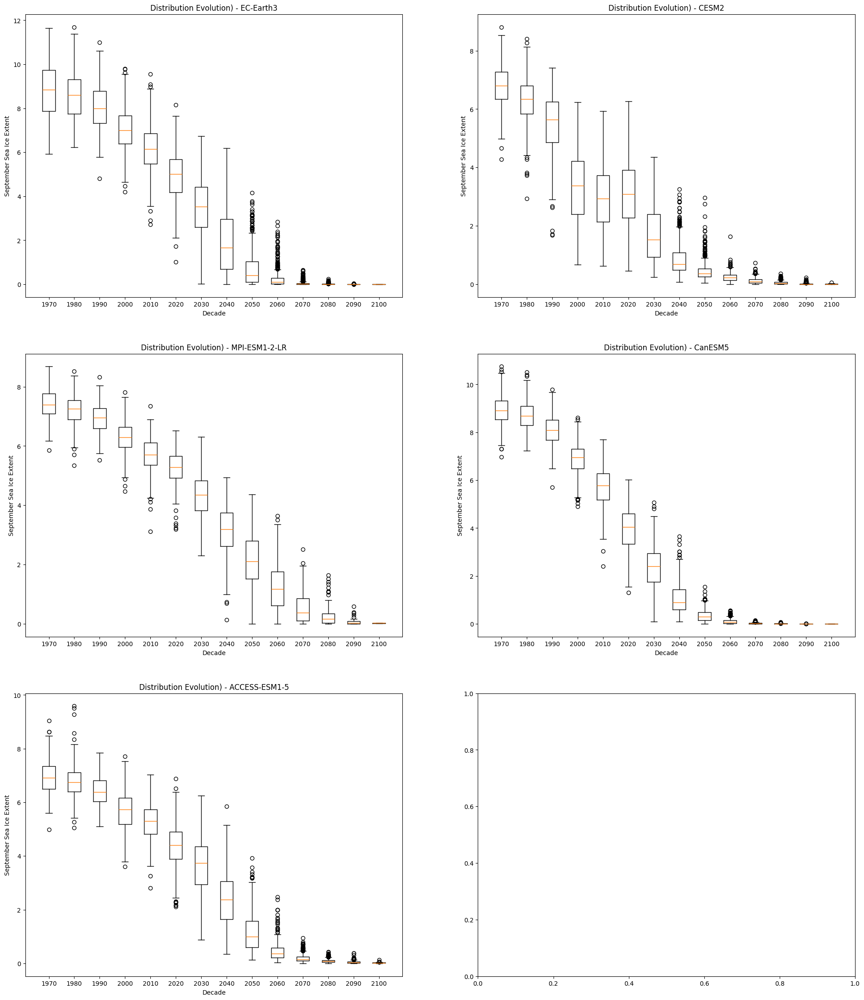

In [55]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(24, 28))
axes = axes.flatten()

for i, model_name in enumerate(MODEL_NAMES):
    ax = axes[i]

    data = model_data["ssie"][model_name]

    decades = (data.index.year // 10) * 10
    unique_decades = np.unique(decades)
    box_data = [data.iloc[decades == d].stack().to_numpy() for d in unique_decades]

    ax.boxplot(box_data, positions=unique_decades, widths=5)
    ax.set_xlabel("Decade")
    ax.set_ylabel("September Sea Ice Extent")
    ax.set_title(f"Distribution Evolution) - {model_name}")

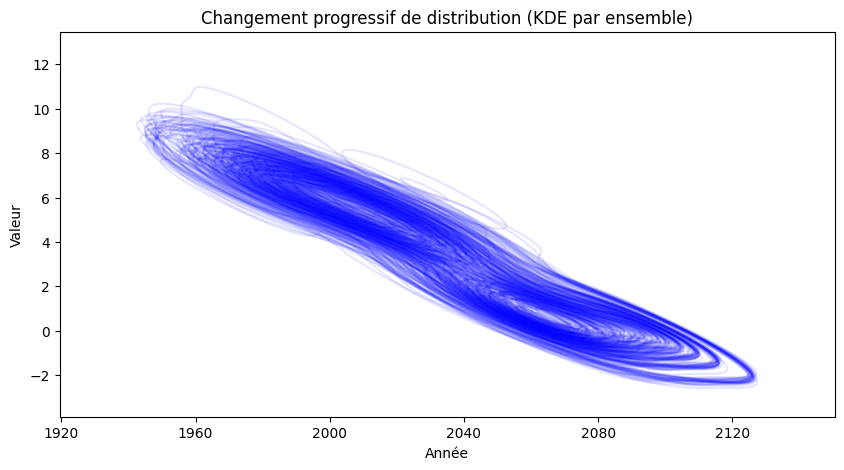

In [59]:
import seaborn as sns

data = model_data["ssie"][model_name]

plt.figure(figsize=(10,5))
for i in range(30):
    sns.kdeplot(x=data.index, y=data[i], fill=False, alpha=0.1, color="blue")

plt.xlabel("Année")
plt.ylabel("Valeur")
plt.title("Changement progressif de distribution (KDE par ensemble)")
plt.show()

## Biases

In [ ]:
fig,axes = plt.subplots(plot_rows, 2, figsize=(24,18))

y = list(model_ensemble_avg_icefree_years.values())

for i, ax in enumerate(axes.flatten()):
    var = VARIABLES_[i]
    x = list(model_ensemble_avg_biases[var].values())
    for j in range(len(x)):
        model_name = MODEL_NAMES[j]
        ax.scatter(x[j], y[j], color=MODEL_COLOURS[model_name], label=f'{model_name}', linewidths=4)
    ax.set_title(var)
    ax.legend()

In [ ]:



fig,axes = plt.subplots(plot_rows,2,figsize=(24,22))

for i, ax in enumerate(axes.flatten()):
    var = VARIABLES_[i]
    for model in MODEL_NAMES:
            x = model_ensemble_biases[var][model].to_numpy()
            y = model_ensemble_icefree_years[model].dt.year.to_numpy()

            fit = LinearRegression().fit(x.reshape(-1, 1), y.reshape(-1, 1))

            ax.scatter(x, y, c=MODEL_COLOURS[model], label=model)

            predict_x = np.linspace(x.min(), x.max())
            predict_y = fit.predict(predict_x.reshape(-1, 1))

            ax.plot(predict_x, predict_y, color=MODEL_COLOURS[model], linestyle="--")
            r2 = fit.score(x.reshape(-1, 1), y.reshape(-1, 1))

            text_y = y.max()
            text_x = x[y.argmax()]

            ax.text(text_x, text_y, f'$R^2 = {r2:.2f}$', fontsize=12, color=MODEL_COLOURS[model]) 


    ax.legend()
    ax.set_title(VAR_YLABELS[var], fontsize=16)
    ax.set_xlabel("Bias (1980-2014)", fontsize=14)
    ax.set_ylabel("First Ice-Free Year", fontsize=14)

In this graph, we plot the biases of each variable over the period 1980-2014 against the first ice-free year, defined by the first year when the summer sea ice extent falls below 1 million km². Regression lines done for each model independently (per variable) are also plotted.

Overall no strong relationship is present across the models for all variables. Most of the $R^2$s are small, though usually the EC-Earth3 model obtains an $R^2$ close to 0.3. CESM2 also tends to slow a slight relationship. In the example of summer sea-ice extent, while it appears that there is a negative relationship between ice-year free years and biases across the models excluding CESM, looking more closely we can see that only EC-Earth3 exhibits this relationsihp, and the other models display a rather flat relationship.




For the summer sea ice extent, the biases of the CESM2 model are all negative and correspond to the earliest first ice-free years. However, the most positive biases, from the EC-Earth3 and CanESM5 models, also produce relatively early first ice-free years compared to those estimated by models with low biases. The biases found between these two extremes correspond to the latest first ice-free years, namely the ACCESS-ESM1-5 and MPI-ESM1-2-LR models. This corresponds to what we see in figure X (David's plot); models with high bias, whether negative or positive — that is, EC-Earth3, CanESM5, and CESM2 — tend to underestimate the first ice-free year.

We see a similar pattern for the winter sea ice extent, corresponding to what is shown in figure X; EC-Earth3 and CanESM5 overestimate the observations, while CESM2 underestimates them, and ACCESS-ESM1-5 as well as MPI-ESM1-2-LR match the observations well. The structure of the first ice-free years for this variable remains the same because it is still based on the summer sea ice extent.

The winter sea ice volume shows a similar pattern to the previous variables, although this time the ACCESS-ESM1-5 and MPI-ESM1-2-LR models exhibit higher biases.

For the annual temperature, we observe a pattern similar to the previous figures, but the models with negative and positive biases are reversed. CESM2 is positive, whereas EC-Earth3 and CanESM5 are negative.

The ocean heat transport variables show completely different patterns. In the figure of Atlantic OHT, we still see that CESM2 shows strong negative biases, but this is also the case for MPI-ESM1-2-LR, leading to a situation where the latest first ice-free years are associated with strong biases. In this figure, the lowest biases come from ACCESS-ESM1-5, EC-Earth3, and CanESM5.


<div style="display: none">Dans ce graphique, nous traçons les biais de chaque variable sur la période de 1980-2014 contre la première année sans glace, indiqué par la première année quand l'étendue de la glace de mer en été atteint moins de 1M km2. 

Pour l'étendue de la grace de mer en été, nous voyons une forme plutôt comme la lettre v à l'envers. Les biais du modèle CESM2 sont tous négatifs, et correspondent aux premières années sans glace les plus tôts. Cependant, les biais les plus positifs, des modèles EC-Earth3 et CanESM5, génèrent également les premières années sans glace assez tôts, par rapport à celles éstimées par les modèles des biais faibles. Les biais trouvés entre les deux extrêmes donnent les premières années sans glace les plus tards, à savoir les modèles ACCESS-ESM1-5 et MPI-ESM1-2-LR. Tout cela corrspond à ce que nous voyons sur la figure X ; les modèles présentant un bias élevé, qu'il soit négatif ou positif, à savoir EC-Earth3, CanESM5, ainsi que CESM2, tendent à sous-estimer la première année sans glace.

Nous voyons une forme similaire pour l'étendue de la glace de mer en hiver, correspondant à ce qui est vu sur la figure X ; EC-Earth3 et CanESM5 sur-estiment les observations, tandis que CESM2 les sous-estiment, et ACCESS-ESM1-5 ainsi que MPI-ESM1-2-LR suivent bien les obseravations. La structure des premières années sans glace pour cette variable reste pareil parce qu'on utilise encore celles basées sur l'étendue de la glace de mer en été.

La volume de glace de mer en hiver présente un figure similaire aux variables précédentes, même si cette fois-ci, les modèles ACCESS-ESM1-5 et MPI-ESM1-2-LR présente des biais plus élevés. 

Pour la température annuelle, on voit une forme similaire aux figures précédentes, mais les modèles de biais négatifs et positifs sont à l'enverse. CESM2 est positif, tandis que EC-Earth3 et CanESM5 sont négatifs. 

Les variables de transport de chaleur océanique présentent des formes complétement différentes. Dans la figure d'OHT atlantique, on voit encore que CESM2 montre des biais fort négatifs, mais c'est également le cas pour MPI-ESM1-2-LR, menant à une situation où les premières années sans glaces les plus tards sont associées à un biais fort. Dans cette figure, les biais les plus faibles proviennent de ACCESS-ESM1-5, EC-Earth3 et CanESM5.</div>



In [ ]:

top = 3

plot_rows = ceil(len(MODEL_NAMES) / 2)

var = "ssie" # EC-Earth3, CESM2, MPI-ESM1-2-LR, CanESM5, ACCESS-ESM1-5

fig, axes = plt.subplots(nrows=plot_rows, ncols=2, figsize=(24, 28))
for i, ax in enumerate(axes.flat):
    if i < len(MODEL_NAMES):
        model = MODEL_NAMES[i] 
    else:
        continue
    data = model_data[var][model]

    biases = model_ensemble_biases[var][model]
    years = model_ensemble_icefree_years[model]

    df = DataFrame({"Bias": biases, "Year": years}).sort_values(by="Bias", ascending=False)
    
    # Right bias extremes
    pos_biases = df.head(top)
    ax.plot(data[pos_biases.index], color="black", alpha=0.6)
    ax.plot([], [], color="black", alpha=0.6, label="Right Extreme")

    # Left bias extremes
    neg_biases = df.tail(top)
    ax.plot(data[neg_biases.index], color="red", alpha=0.6)
    ax.plot([], [], color="red", alpha=0.6, label="Left Extreme")

    # Ensemble mean
    ax.plot(model_ensemble_avgs[var][model], color="blue", lw=2, label="Ensemble Mean")

    # GFED era
    ax.axvline(x=Timestamp('1997-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
    ax.axvline(x=Timestamp('2014-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
    ax.axhline(y=1, color='black', linestyle=':', linewidth=2)

    ax.legend()

    ax.set_title(f"{model} - {var.upper()} (All {data.shape[1]} Ensembles)")
    ax.set_xlabel("Time Step")
    ax.set_ylabel(VAR_YLABELS[var])
    ax.grid(True)

plt.show()



For these plots we consider the ensemble members with the 5 largest and 5 lowest biases for each model. We plot them with the ensemble average. The horizontal line indicates the ice-free levels, and the vertical lines indicate the GFED period. 

For the CESM2 model, which showed the earliest ice-free years, appears particularly affected by the GFED period, in line with previous research. It is during this period that the model reaches ice-free years for the first time, and these are associated with the most negative biases, reflecting the positive relationship exhibited by this model.

For EC-Earth3, which has displayed negative relationship between bias and ice-free years, we see that the ensembles associated with the smallest biases (red) are below the ensemble average (blue), while the ensembles associated with the largest biases (black) are above the ensemble average. However, after the observational period, the red ensembles mostly switch to be on top of the average, while the black ensembles switch to the bottom, and so it is the ensembles with the largest biases that obtain the earliest ice-free years.

The other models present less obvious behaviour. These models did not show strong relationships between bias and ice-free years, While we generally see the red ensembles on the bottom and the black ensembles on top in the beginning, once the observational period finishes, the ensembles mix, leading to no clear relationship once the first ice-free years are met.


In [ ]:
top = 3

plot_rows = ceil(len(MODEL_NAMES) / 2)

var = "ssie" # EC-Earth3, CESM2, MPI-ESM1-2-LR, CanESM5, ACCESS-ESM1-5

fig, axes = plt.subplots(nrows=plot_rows, ncols=2, figsize=(24, 28))
for i, ax in enumerate(axes.flat):
    if i < len(MODEL_NAMES):
        model = MODEL_NAMES[i] 
    else:
        continue
    data = model_data[var][model]

    biases = model_ensemble_biases[var][model]
    years = model_ensemble_icefree_years[model]

    df = DataFrame({"Bias": biases, "Year": years}).sort_values(by="Year")

    
    # Min Years
    min_years = df.head(top)
    ax.plot(data[min_years.index], color="black", alpha=0.6)
    ax.plot([], [], color="black", alpha=0.6, label="Min Years")

    # Max Years
    max_years = df.tail(top)
    ax.plot(data[max_years.index], color="red", alpha=0.6)
    ax.plot([], [], color="red", alpha=0.6, label="Max Years")

    # Ensemble average
    ax.plot(model_ensemble_avgs[var][model], color="blue", lw=2, label="Ensemble Mean")

    # GFED era
    ax.axvline(x=Timestamp('1997-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
    ax.axvline(x=Timestamp('2014-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
    ax.axhline(y=1, color='black', linestyle=':', linewidth=2)

    ax.legend()

    ax.set_title(f"{model} - {var.upper()} (All {data.shape[1]} Ensembles)")
    ax.set_xlabel("Time Step")
    ax.set_ylabel(VAR_YLABELS[var])
    ax.grid(True)

plt.show()

In [ ]:
import seaborn

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(24, 10))

var = "ssie"

for i, model in enumerate(MODEL_NAMES):
    ax = axes[i]
    seaborn.boxplot(model_ensemble_biases[var][model], ax=ax)
    ax.set_title(model)

In [ ]:
model_ensemble_icefree_years[model][pos_biases.index]

In [ ]:
np.nanmean(warm_fisy.dt.year)

In [ ]:
MODEL_NAMES 

In [ ]:

var = "ssie"
models = ['MPI-ESM1-2-LR', "ACCESS-ESM1-5"] # 'EC-Earth3', 'CESM2', , 'CanESM5', 'ACCESS-ESM1-5'

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(24, 10))

for i, ax in enumerate(axes.flatten()):
    model = models[i]
    biases = model_ensemble_biases[var][model]
    data = model_data[var][model]

    pos_biases = biases[biases > 0]
    neg_biases = biases[biases < 0]

    warm_group = data[pos_biases.index]
    cold_group = data[neg_biases.index]

    warm_mean = warm_group.mean(axis=1)
    warm_std = warm_group.std(axis=1)

    cold_mean = cold_group.mean(axis=1)
    cold_std = cold_group.std(axis=1)

    warm_fisy = model_ensemble_icefree_years[model][pos_biases.index]
    cold_fisy = model_ensemble_icefree_years[model][neg_biases.index]

    plt.figure(figsize=(10, 6))

    x = warm_mean.index

    ax.plot(x, warm_mean, color='red', label='Warm (average)')
    ax.fill_between(x, warm_mean - warm_std, warm_mean + warm_std, color='red', alpha=0.3)

    ax.plot(x, cold_mean, color='blue', label='Cold (average)')
    ax.fill_between(x, cold_mean - cold_std, cold_mean + cold_std, color='blue', alpha=0.3)

    ax.axvline(warm_fisy.mean(), color='red', linestyle='--', label='First Ice-Free Year Warm (average)')
    ax.axvline(cold_fisy.mean(), color='blue', linestyle='--', label='First Ice-Free Year Cold (average)')
    ax.axhline(y=1, color='black', linestyle=':', linewidth=2)

    ax.legend()

plt.tight_layout()
plt.show()


In [ ]:
var = "ssie"
model = "EC-Earth3"

biases = model_ensemble_biases[var][model].sort_values()
data = model_data[var][model]

top = 10

pos_biases = biases.head(top)
neg_biases = biases.tail(top)

In [ ]:
neg_biases

In [ ]:
pos_biases

In [ ]:
var = "ssie"
top = 10

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(24, 28))

for i, ax in enumerate(axes.flatten()):
    if i < len(MODEL_NAMES):
        model = MODEL_NAMES[i]
    else:
        continue

    biases = model_ensemble_biases[var][model].sort_values(ascending=False)
    data = model_data[var][model]

    pos_biases = biases.head(top)
    neg_biases = biases.tail(top)

    warm_group = data[pos_biases.index]
    cold_group = data[neg_biases.index]

    warm_mean = warm_group.mean(axis=1)
    warm_std = warm_group.std(axis=1)

    cold_mean = cold_group.mean(axis=1)
    cold_std = cold_group.std(axis=1)

    warm_fisy = model_ensemble_icefree_years[model][pos_biases.index]
    cold_fisy = model_ensemble_icefree_years[model][neg_biases.index]

    x = warm_mean.index

    group1_tilt = "Cold" if pos_biases.mean() > 0 else "Warm"
    group2_tilt = "Cold" if neg_biases.mean() > 0 else "Warm"

    ax.plot(x, warm_mean, color='red', label=f'Group 1 - {group1_tilt}')
    ax.fill_between(x, warm_mean - warm_std, warm_mean + warm_std, color='red', alpha=0.3)

    ax.plot(x, cold_mean, color='blue', label=f'Group 2 - {group2_tilt}')
    ax.fill_between(x, cold_mean - cold_std, cold_mean + cold_std, color='blue', alpha=0.3)

    ax.axvline(warm_fisy.mean(), color='red', linestyle='--', label='Group 1 First Ice-Free Year (average)')
    ax.axvline(cold_fisy.mean(), color='blue', linestyle='--', label='Group 2 First Ice-Free Year Cold (average)')
    ax.axhline(y=1, color='black', linestyle=':', linewidth=2)
    ax.set_title(model)

    ax.text(Timestamp("2060-01-01"), 5, f'Averge Model Bias: {model_ensemble_avg_biases[var][model]:.2f}', fontsize=12) 

    

    ax.legend()
plt.tight_layout()


In [ ]:
var = "ssie"
top = 10

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(24, 28))

for i, ax in enumerate(axes.flatten()):
    if i < len(MODEL_NAMES):
        model = MODEL_NAMES[i]
    else:
        continue

    biases = model_ensemble_biases[var][model].sort_values()
    data = model_data[var][model]

    pos_biases = biases.head(top)
    neg_biases = biases.tail(top)

    warm_std = data[pos_biases.index].std(axis=1)
    cold_std = data[neg_biases.index].std(axis=1)

    warm_fisy = model_ensemble_icefree_years[model][pos_biases.index]
    cold_fisy = model_ensemble_icefree_years[model][neg_biases.index]

    x = warm_mean.index

    group1_tilt = "Warm" if pos_biases.mean() > 0 else "Cold"
    group2_tilt = "Warm" if neg_biases.mean() > 0 else "Cold"

    ax.plot(x, warm_std, color='red', label=f'Group 1 - {group1_tilt}')

    ax.plot(x, cold_std, color='blue', label=f'Group 2 - {group2_tilt}')

    ax.axvline(Timestamp("2023-01-01"), color='black', linestyle='--')
    # ax.axvline(cold_fisy.mean(), color='blue', linestyle='--', label='Group 2 First Ice-Free Year Cold (average)')
    ax.set_title(model)

    ax.legend()


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(24, 10))

var = "ssie"

for model in MODEL_NAMES:
    
    biases = model_ensemble_biases[var][model]
    data = model_data[var][model]

    pos_biases = biases[biases > 0]
    neg_biases = biases[biases < 0]

    warm_ensembles = data[pos_biases.index]
    label = f"{model} - Bias: {model_ensemble_avg_biases[var][model]:.2f}"
    if not warm_ensembles.empty and "ACCESS" not in model:
        axes[0].plot(warm_ensembles.std(axis=1), color=MODEL_COLOURS[model], label=label)

    cold_ensembles = data[neg_biases.index]
    if not cold_ensembles.empty and "EC" not in model:
        axes[1].plot(cold_ensembles.std(axis=1), color=MODEL_COLOURS[model], label=label)


axes[0].axvline(x=Timestamp('2023-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
axes[0].legend()
axes[0].set_ylim(0, 2.75)
axes[0].set_title("Cold Bias Variability")
axes[0].set_ylabel("Standard Deviation")

axes[1].axvline(x=Timestamp('2023-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
axes[1].legend()
axes[1].set_ylim(0, 2.75)
axes[1].set_title("Warm Bias Variability")
axes[1].set_ylabel("Standard Deviation")


MPI is about 50/50 across cold and warm biases. We see that the evoluation of its variability is largely the same for both types of biases, though its cold bias variability is slighyly more accentuated. Interestingly, MPI's overall model bias is the smallest of all the models, by a significant margin. For all models we see that the variability increase over the historical period and tends to continue so for at least a short period of time before dropping off to 0. However, MPI's variability maintains an elevated variability for both warm and cold bias ensembles. 

EC-Earth has a particularly elevated variability and one of the largest biases. However, it also has a quite sharp drop in variability. Models exhibiting larger biases are associated with sharper and earlier drops, while smaller biased models (MPI, ACCESS) are associated with a sustained elevated variability after the historical period.

Hypotheses:
- Bias corrected models will exhibit sustained elevated variability after the historical period. 

Overall, I expect bias corrected models to converge to similar patterns, e.g. sustained variability, similar ice-free years, similar causal flows. 

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(24, 10))

var = "ssie"

ax0_2 = axes[0].twinx()
ax1_2 = axes[1].twinx()

for model in MODEL_NAMES:
    
    biases = model_ensemble_biases[var][model]
    data = model_data[var][model]

    pos_biases = biases[biases > 0]
    neg_biases = biases[biases < 0]

    warm_ensembles = data[pos_biases.index]
    label = f"{model} - Bias: {model_ensemble_avg_biases[var][model]:.2f}"
    last_year_ice = data.loc['2023-01-01']
    if not warm_ensembles.empty and "ACCESS" not in model:
        axes[0].plot(warm_ensembles.std(axis=1), color=MODEL_COLOURS[model], label=label)
        ax0_2.axhline(y=last_year_ice[pos_biases.index].mean(), linestyle='--', color=MODEL_COLOURS[model])

    cold_ensembles = data[neg_biases.index]
    if not cold_ensembles.empty and "EC" not in model:
        axes[1].plot(cold_ensembles.std(axis=1), color=MODEL_COLOURS[model], label=label)
        ax1_2.axhline(y=last_year_ice[neg_biases.index].mean(), linestyle='--', color=MODEL_COLOURS[model])


axes[0].axvline(x=Timestamp('2023-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
axes[0].legend()
axes[0].set_ylim(0, 2.75)
axes[0].set_title("Warm Bias Variability")
axes[0].set_ylabel("Standard Deviation")

ax0_2.axhline(y=model_data[var]["Observations"].mean(), color="black", linestyle='--')
ax0_2.set_ylabel("Averge Ice Extent (2023)")




axes[1].axvline(x=Timestamp('2023-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
axes[1].legend()
axes[1].set_ylim(0, 2.75)
axes[1].set_title("Cold Bias Variability")
axes[1].set_ylabel("Standard Deviation")

ax1_2.axhline(y=model_data[var]["Observations"].mean(), color="black", linestyle='--')
ax1_2.set_ylabel("Averge Ice Extent (2023)")

In [ ]:

top = 3

plot_rows = ceil(len(MODEL_NAMES) / 2)

var = "ssie" # EC-Earth3, CESM2, MPI-ESM1-2-LR, CanESM5, ACCESS-ESM1-5


hist_period_ice_amount_stds = {}


fig, axes = plt.subplots(nrows=plot_rows, ncols=2, figsize=(24, 28))
for i, ax in enumerate(axes.flat):
    if i < len(MODEL_NAMES):
        model = MODEL_NAMES[i] 
    else:
        continue
    data = model_data[var][model]
    
    df = data.loc['2023-01-01'].sort_values()

    hist_period_ice_amount_stds[model] = df.std()
    
    # Right bias extremes
    pos_biases = df.head(top)
    ax.plot(data[pos_biases.index], color="black", alpha=0.6)
    ax.plot([], [], color="black", alpha=0.6, label="Least Ice")

    # Left bias extremes
    neg_biases = df.tail(top)
    ax.plot(data[neg_biases.index], color="red", alpha=0.6)
    ax.plot([], [], color="red", alpha=0.6, label="Most Ice")

    # Ensemble mean
    ax.plot(model_ensemble_avgs[var][model], color="blue", lw=2, label="Ensemble Mean")

    # End of historical period
    ax.axvline(x=Timestamp('2023-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
    ax.axhline(y=1, color='black', linestyle=':', linewidth=2)

    ax.legend()

    ax.set_title(f"{model} - {var.upper()} (All {data.shape[1]} Ensembles)")
    ax.set_xlabel("Time Step")
    ax.set_ylabel(VAR_YLABELS[var])
    ax.grid(True)

plt.show()

In [ ]:
from matplotlib import colormaps

top = 10

plot_rows = ceil(len(MODEL_NAMES) / 2)

var = "ssie" # EC-Earth3, CESM2, MPI-ESM1-2-LR, CanESM5, ACCESS-ESM1-5

dfs = {}

fig, axes = plt.subplots(nrows=plot_rows, ncols=2, figsize=(24, 28))
for i, ax in enumerate(axes.flat):
    if i < len(MODEL_NAMES):
        model = MODEL_NAMES[i] 
    else:
        continue
    data = model_data[var][model]


    df = data.loc['2023-01-01'].sort_values()

    hist_period_ice_amount_stds[model] = df.std()
    
    # Right bias extremes
    pos_biases = df.head(top)
    ax.plot(data[pos_biases.index].std(axis=1), color="black", alpha=0.6)
    ax.plot([], [], color="black", alpha=0.6, label="Least Ice")

    # Left bias extremes
    neg_biases = df.tail(top)
    ax.plot(data[neg_biases.index].std(axis=1), color="red", alpha=0.6)
    ax.plot([], [], color="red", alpha=0.6, label="Most Ice")

    ax.legend()

    # End of observational period
    ax.axvline(x=Timestamp('2023-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)

    ax.set_title(f"{model} - {var.upper()} (All {data.shape[1]} Ensembles)")
    ax.set_xlabel("Time Step")
    ax.set_ylabel(VAR_YLABELS[var])
    ax.grid(True)


In [ ]:
from matplotlib import colormaps

top = 10

plot_rows = ceil(len(MODEL_NAMES) / 2)

ranges = {
    0: [0, 0.05],
    1: [0.05, 0.1],
    2: [0.1, 0.2],
    3: [0.2, 0.3],
    4: [0.3, 0.5]
}

var = "ssie" # EC-Earth3, CESM2, MPI-ESM1-2-LR, CanESM5, ACCESS-ESM1-5

dfs = {}

cmap = colormaps.get_cmap('tab10')

fig, axes = plt.subplots(nrows=plot_rows, ncols=2, figsize=(24, 28))
for i, ax in enumerate(axes.flat):
    if i < len(MODEL_NAMES):
        model = MODEL_NAMES[i] 
    else:
        continue
    data = model_data[var][model]

    biases = model_ensemble_biases[var][model]
    years = model_ensemble_icefree_years[model]

    df = DataFrame({"Bias": biases, "Year": years}).sort_values(by="Bias", ascending=False)
    obs_mean = filter_by_years(model_data[var]["Observations"], bias_start, bias_end).mean()
    df['Bias_pc'] = df['Bias'] / obs_mean

    s = df['Bias_pc'].abs()
    df['Ensemble group'] = np.nan

    for range_num, range in ranges.items():
        df['Ensemble group'] = np.where(
            np.logical_and(range[0] <= s, s < range[1]),
            range_num,
            df['Ensemble group']
        )
    
    group_stds = {}
    groups = df['Ensemble group'].unique()
    for group in groups:
        temp = df[df['Ensemble group'] == group]
        group_std = data[temp.index].std(axis=1)

        ax.plot(group_std, color=cmap(int(group)), alpha=0.6, label=f"Group {group} Bias std")

    ax.legend()

    # End of observational period
    ax.axvline(x=Timestamp('2023-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)

    ax.set_title(f"{model} - {var.upper()} (All {data.shape[1]} Ensembles)")
    ax.set_xlabel("Time Step")
    ax.set_ylabel(VAR_YLABELS[var])
    ax.grid(True)


In [ ]:

fig,axes = plt.subplots(plot_rows,2,figsize=(24,22))

var = "ssie"

for i, ax in enumerate(axes.flatten()):
    for model in MODEL_NAMES:
        threshold = 0.5 + i * 0.5
        ice_free_years = calculate_first_icefree_year(model_data["ssie"][model], threshold)
        ax.scatter(model_ensemble_biases[var][model], ice_free_years, c=MODEL_COLOURS[model], label=model)
    ax.legend()
    ax.set_title(VAR_YLABELS_SHORT[var] + f" Ice Free Threshold: {threshold}", fontsize=16)
    ax.set_xlabel("Bias (1980-2014)", fontsize=14)
    ax.set_ylabel("First Ice-Free Year", fontsize=14)

In [ ]:
obs_begin = '1980-01-01'
obs_end = '2014-01-01'

gfed_begin = '1997-01-01'
gfed_end = '2014-01-01'



pre_gfed_model_ensemble_biases = {
    var: {
        model: calculate_bias(model_data[var]["Observations"], model_data[var][model], obs_begin, gfed_begin)
        for model in MODEL_NAMES
    } for var in VARIABLES_
}

gfed_model_ensemble_biases = {
    var: {
        model: calculate_bias(model_data[var]["Observations"], model_data[var][model], gfed_begin, gfed_end)
        for model in MODEL_NAMES
    } for var in VARIABLES_
}



fig,axes = plt.subplots(plot_rows,2,figsize=(24,22))

for i, ax in enumerate(axes.flatten()):
    var = VARIABLES_[i]
    for model in MODEL_NAMES:
            x = pre_gfed_model_ensemble_biases[var][model].to_numpy()
            y = model_ensemble_icefree_years[model].dt.year.to_numpy()

            fit = LinearRegression().fit(x.reshape(-1, 1), y.reshape(-1, 1))

            ax.scatter(x, y, c=MODEL_COLOURS[model], label=model)

            predict_x = np.linspace(x.min(), x.max())
            predict_y = fit.predict(predict_x.reshape(-1, 1))

            ax.plot(predict_x, predict_y, color=MODEL_COLOURS[model], linestyle="--")


    ax.legend()
    ax.set_title(VAR_YLABELS[var], fontsize=16)
    ax.set_xlabel("Bias (1980-1997)", fontsize=14)
    ax.set_ylabel("First Ice-Free Year", fontsize=14)

## Autocorrelation

In [ ]:
def plot_model_ac_average(
        var: str,
        model_data: DataFrame,
        ax: "Axes",
        start_year: str = "",
        end_year: str = "",
        fill_between: bool = False,
    ) -> "Axes":
    detrended = subtract_ensemble_mean(model_data)
    detrended = detrended.diff().dropna()

    acf_df = detrended.apply(lambda x: acf(x, nlags=100))
    acf_mean = calculate_ensemble_mean(acf_df)
    acf_min = calculate_ensemble_min(acf_df)
    acf_max = calculate_ensemble_max(acf_df)
    x = range(len(acf_mean))

    ax.plot(x, acf_mean, color=MODEL_COLOURS[model], label=model)
    if fill_between:
        ax.fill_between(
            x, acf_min, acf_max, color=MODEL_COLOURS[model], alpha=0.1,
        )
    ax.set_title(f"{VAR_YLABELS_SHORT[var]} Autocorrelation {start_year}-{end_year}")
    ax.grid(True)

In [ ]:
acf_start_year = "1980-01-01"
acf_end_year = "2014-01-01"


fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 24))

fig.suptitle('Autocorrelations 1980-2014', fontsize=16)

for i, ax in enumerate(axes.flat):
    if i >= len(VAR_NAMES[:-2]):
        continue 

    var = VAR_NAMES[:-2][i]
    for model in MODEL_NAMES:
        filtered = filter_by_years(model_data[var][model], acf_start_year, acf_end_year)
        plot_model_ac_average(var, filtered, ax, acf_start_year, acf_end_year, fill_between=True)

    obs_filtered = filter_by_years(observations[var], acf_start_year, acf_end_year)
    detrend_obs = detrend(obs_filtered)
    detrend_obs = np.diff(detrend_obs)
    acf_values = acf(detrend_obs, nlags=100)

    ax.plot(range(len(acf_values)), acf_values, label="Observations")

    ax.legend(loc='upper right')
    ax.set_xlabel('Lag')
    ax.set_ylabel('Autocorrelation')
    ax.set_title(VAR_YLABELS_SHORT[var])
    ax.grid(True)

fig.subplots_adjust(wspace=0.3, hspace=0.3)

For SSIE and WSIE, the autocorrelation decreases rapidly, becoming negligible after a lag of between 5 and 10 years. However, WSIE shows a slightly more persistent memory, with a wider range across models for when the autocorrelation reaches zero. Additionally, after crossing zero autocorrelation, the autocorrelations are more negative for WSIE.

WSIV follows a similar dynamic, especially to WSIE, although the range across models is narrower, and the persistence is more negative.

For TAS, the overall shape closely follows that of SSIE in terms of the first lag when autocorrelations reach zero and the range of values across models.

For OHT\_PAC, the decay is particularly pronounced, showing a weak memory in the time series.

Overall, we see that that the autocorrelations are relatively the same across different models for a given variable. For each of the models, the min and max autocorrelation has been plotted. As the lines represent the average of the autocorrelations, we can see that there is a lot of variation across the ensembles for a given model. 


<div style="display: none">Pour SSIE et WSIE, l’autocorrélation décroît rapidement, devenant négligeable après un lag d'entre 5 et 10 ans. Cepedant, WSIE présente une mémoire légèrement plus persistente, ayant un éventail plus large à travers les modèles pour quand ils atteignent 0. En plus, après traverser une autocorrélation 0, les autocorrélations sont plus négatives pour WSIE.

Le WSIV suit une dynamique similaire, surtout qu'au WSIE, bien que l'éventail des modèles soit plus étroit, et une persistance plus négatives.

Pour TAS, la forme générale suit celle de SSIE assez prochement, en termes de le premier lag quand les autocorrélations atteignent 0 et l'éventail des valeurs à travers les modèles.

Pour OHT_PAC, la décroissance est particulièrement marquée, montrant une mémoire faible des séries.</div> 

In [ ]:
start_year = 1980
end_year = 2060

var = "tas"

year_range = range(start_year, end_year, 10)
n_periods = len(year_range)

nrows = ceil(n_periods / 4)
fig, axes = plt.subplots(nrows=nrows, ncols=4, figsize=(18, 4 * nrows))

for ax, year in zip(axes.flat, year_range):
    for model in MODEL_NAMES:
        corr_end_year = year+10
        filtered = filter_by_years(model_data[var][model], f"{year}-01-01", f"{corr_end_year}-01-01")
        plot_model_ac_average(
            var, filtered, ax, year, corr_end_year, fill_between=True
        )
        ax.legend()

Here we compute the autocorrelation for every 10-year segment between 1980 and 2060. We can see that the overall structure of the autocorrelation remains stable. This holds across all variables. Though the AC functions differ between variables, the variables remain consistent with the previous AC plot. In addition, the shape and persistance of the autocorrelation functions are consistent across decades for a given variable. The variations around the mean AC values are very similar to those observed over the entire time period. This suggests no significant shifts or regime changes over time.

In [ ]:
var = "tas"

year_range = range(start_year, end_year+10, 10)

n_periods = len(year_range[1:])
nrows = ceil(n_periods / 4)
fig, axes = plt.subplots(nrows=nrows, ncols=4, figsize=(18, 4 * nrows))

for ax, end_year in zip(axes.flat, year_range[1:]):
    for model in MODEL_NAMES:
        filtered = filter_by_years(model_data[var][model], f"{start_year}-01-01", f"{end_year}-01-01")
        plot_model_ac_average(
            var, filtered, ax, start_year, end_year, fill_between=True
        )
        ax.legend()

Here we plot the autocorrelations for various periods, each starting from 1980 and increasing by 10 years. Overall, the persistance and variability remains stable for a given variable as the period increases. In additon, what we see is consistent with previous plots. However, there are some notable deviations. For certain variables, e.g. SSIE, WSIE, TAS, WSIV, the autocorrelation function for the EC-Earth3 model starts to deform from a period of 50 years and onwards. The persistance starts to increase, while the other models remain stable, and the later lags become more negative. 

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 24))

var = "ssie"

for i, ax in enumerate(axes.flat):
    if i == 5:
        break
    var_data = filter_by_years(model_data[var][MODEL_NAMES[i]], acf_start_year, acf_end_year)
    var_detrended = var_data.subtract(var_data.mean(axis=1), axis=0)
    acf_df = var_detrended.apply(lambda x: acf(x, nlags=100))

    ax.plot(range(len(acf_df)), acf_df, color="lightgrey")
    ax.plot(range(len(acf_df)), acf_df.mean(axis=1), color="red", linewidth=2, label='Ensemble Mean')
    ax.set_xlabel('Lag')
    ax.set_ylabel('Autocorrelation')
    ax.set_title(f'Autocorrelation of {MODEL_NAMES[i]} {var.upper()}')
    ax.grid(True)

## Correlation

In [ ]:
corr_start_year = "1970-01-01"
corr_end_year = "2060-01-01"

In [ ]:
# Calculate the correlations between series like in the article
model_corrs = {}
for var in VAR_NAMES:
    model_corrs[var] = {}
    for model in MODEL_NAMES:
        x = filter_by_years(
            model_data[var][model], corr_start_year, corr_end_year,
        )
        x_detrended = subtract_ensemble_mean(x)

        y = filter_by_years(
            model_data["ssie"][model], corr_start_year, corr_end_year,
        )
        y_detrended = subtract_ensemble_mean(y)

        model_corrs[var][model] = calculate_correlation_ensemble_mean(
            x_detrended, y_detrended, corr_type="pearson",
        )


In [ ]:

CORR_VARS = ["wsiv", "tas", "oht_atl", "oht_pac"]

fig, ax = plt.subplots()
ax.grid(linestyle='--')

for i, var in enumerate(CORR_VARS):
    for j, model in enumerate(MODEL_NAMES):

        corr = model_corrs[var][model]
        if np.isnan(corr):
            continue
        x = i - 0.2 + j * 0.05

        ax.scatter(x, corr, label=model, c=MODEL_COLOURS[model], s=100)


# Formatage
ax.set_xticks(range(len(CORR_VARS)))
ax.set_xticklabels([VAR_YLABELS_SHORT[var] for var in CORR_VARS])
ax.set_ylabel("Correlation coefficient R")
ax.axhline(0, color='black', linestyle='--')
ax.set_ylim(-1, 1)
ax.grid(linestyle='--')

plt.tight_layout()
plt.show()


The plot is fairly similar to what is in the article, though there are slight differences. It might be just be a scaling issue, but the correlations for OHT_ATL and OHT_PAC are closer to zero in the article.

## Causality

In [14]:
def calculate_all_liang_flows(
        model_data: dict,
        y_var: str,
        var_liangs: list[str],
        liang_start: str,
        liang_end: str,
        dt: int = 1,
        n_iter: int = 1000,
    ) -> dict:
    tau_avgs = {}
    combined_pvalues = {}
    ensemble_flows = {}
    ensemble_pvalues = {}
    for model in MODEL_NAMES:
        # Prepare data for liang flow calc
        ssie_liang = prepare_for_liang(model_data[y_var][model], liang_start, liang_end)
        liang_data = {
            var: prepare_for_liang(model_data[var][model], liang_start, liang_end) for var in var_liangs
        }

        # Liang flow calc
        liang_indexes, p_values = calculate_liang_model_flows(liang_data, ssie_liang, dt, n_iter)

        # Add ensemble flows and pvalues
        ensemble_flows[model] = np.array(liang_indexes)
        ensemble_pvalues[model] = p_values

        # Add ensemble mean flow and pvalue
        tau_avgs[model] = calculate_tau_avg(liang_indexes, var_liangs)
        combined_pvalues[model] = calculate_combined_pvalues(p_values, var_liangs)

    return {
        "tau_avgs": tau_avgs,
        "combined_pvalues": combined_pvalues,
        "ensemble_flows": ensemble_flows,
        "ensemble_pvalues": ensemble_pvalues,
    }


def plot_liang_tau_avgs(liang_res, var_liangs):
    fig, ax = plt.subplots()
    ax.grid(linestyle='--')

    jitter = 0.1

    for j, var in enumerate(var_liangs):
        for i, model in enumerate(MODEL_NAMES):

            tau = liang_res["tau_avgs"][model][var]
            pvalue = liang_res["combined_pvalues"][model][var]
            x = j - 0.2 + i * jitter

            # Black circle if significant
            kwargs = {"edgecolors": 'black', "linewidths": 2} if pvalue <= 0.05 else {}

            ax.scatter(x, tau, label=model, c=MODEL_COLOURS[model], s=100, **kwargs)

    ax.set_xticks(range(len(var_liangs)))
    ax.set_xticklabels([VAR_YLABELS_SHORT[var] for var in var_liangs])
    ax.set_ylabel("Information Transfer")
    ax.axhline(0, color='black', linestyle='--')
    ax.set_ylim(-1, 30)
    ax.grid(linestyle='--')
    ax.set_axisbelow(True)

    plt.tight_layout()

def plot_ensemble_bias_flows(liang_res, biases, var_liangs, bias_var: str | None = None) -> None:
    _, axes = plt.subplots(2,2,figsize=(24,18))

    for i, ax in enumerate(axes.flatten()):
        for model in MODEL_NAMES:

            var = var_liangs[i] if bias_var is None else bias_var
            model_biases = biases[var][model]
            flows = liang_res["ensemble_flows"][model][:,i]

            ax.scatter(model_biases, flows, c=MODEL_COLOURS[model], label=model)

        ax.legend()
        ax.set_title(f"{VAR_YLABELS_SHORT[var]} Bias v Liang Flow ({VAR_YLABELS_SHORT[var_liangs[i]]} $-->$ ssie)", fontsize=16)
        ax.set_xlabel("Bias (1980-2014)", fontsize=14)
        ax.set_ylabel("Liang Flow (1970-2060)", fontsize=14)

In [15]:
dt = 1
n_iter = 1000
liang_start = "1970-01-01"
liang_end = "2060-01-01"
var_liangs = ["wsiv", "tas", "oht_atl", "oht_pac"]


liang_res = calculate_all_liang_flows(model_data, "ssie", var_liangs, liang_start, liang_end)


c:\Users\bensi\pyIMT\icefreearcticml\icefreearcticml\liangindex\function_liang_nvar.py:84: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (Array(float64, 2, 'F', False, aligned=True), Array(float64, 1, 'A', False, aligned=True))
  a1k = np.dot(np.linalg.inv(C),dC[:,i]) # compute a1k coefficients based on matrix-vector product (see beginning of page 4 in Liang (2014))


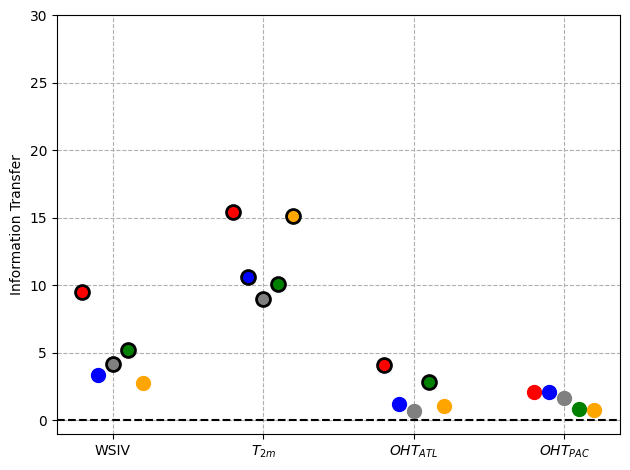

In [16]:
plot_liang_tau_avgs(liang_res, var_liangs)

In [ ]:
plot_ensemble_bias_flows(liang_res, model_ensemble_biases, var_liangs)

In [ ]:
fig,axes = plt.subplots(2,2,figsize=(24,18))

for i, ax in enumerate(axes.flatten()):
    for model in MODEL_NAMES:

        biases = model_ensemble_biases[var_liangs[i]][model]
        flows = liang_res["ensemble_flows"][model][:,i]
        years = model_ensemble_icefree_years[model].dt.year.to_numpy()

        ax.scatter(years, flows, c=MODEL_COLOURS[model], label=model)

    ax.legend()
    ax.set_title(f"First Ice-Free Year v Liang Flow ({VAR_YLABELS_SHORT[var_liangs[i]]} $-->$ ssie)", fontsize=16)
    ax.set_xlabel("Liang Flow (1970-2060)", fontsize=14)
    ax.set_ylabel("First Ice-Free Year", fontsize=14)

In [ ]:
top = 3

plot_rows = ceil(len(MODEL_NAMES) / 2)

var = "ssie" # EC-Earth3, CESM2, MPI-ESM1-2-LR, CanESM5, ACCESS-ESM1-5
flow_var = "tas"

fig, axes = plt.subplots(nrows=plot_rows, ncols=2, figsize=(24, 28))
for i, ax in enumerate(axes.flat):
    if i < len(MODEL_NAMES):
        model = MODEL_NAMES[i] 
    else:
        continue
    data = model_data[var][model]

    df = DataFrame(
        liang_res['ensemble_flows'][model],
        columns=[*var_liangs, "ssie"],
    ).sort_values(
        by=flow_var,
        ascending=False,
    )

    # Right bias extremes
    pos_biases = df.head(top)
    ax.plot(data[pos_biases.index], color="black", alpha=0.6)
    ax.plot([], [], color="black", alpha=0.6, label="Right Extreme")

    # Left bias extremes
    neg_biases = df.tail(top)
    ax.plot(data[neg_biases.index], color="red", alpha=0.6)
    ax.plot([], [], color="red", alpha=0.6, label="Left Extreme")

    # Ensemble mean
    ax.plot(model_ensemble_avgs[var][model], color="blue", lw=2, label="Ensemble Mean")

    # GFED era
    ax.axvline(x=Timestamp('1997-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
    ax.axvline(x=Timestamp('2014-01-01 00:00:00'), color='black', linestyle=':', linewidth=2)
    ax.axhline(y=1, color='black', linestyle=':', linewidth=2)

    ax.legend()

    ax.set_title(f"{model} - {var.upper()} (All {data.shape[1]} Ensembles)")
    ax.set_xlabel("Time Step")
    ax.set_ylabel(VAR_YLABELS[var])
    ax.grid(True)

plt.show()



## PCA (In Progress)

In this section, we will do a PCA on the model ensemble averages for SSIE. The idea is keep 2 or 3 the principal components that explain most of the variance (more than 90% hopefully). Detrending is applied to the ensemble averages before applying PCA.

Next, we calculate the biases for each variable for all model ensemble averages. This is calculated as the model ensemble average minus the mean observation over the period (1980-2014), which gives a series of biases for each variable and model. 

A linear regression is performed on the PCA to predict the biases. A regression is done for per variable per model.


All data are filtered to be between 1980 and 2014. 

In [5]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from scipy.signal import detrend

In [ ]:
def plot_model_df(model_df: DataFrame, ax: "Axes" = None) -> None:
    """Columns of model_df must be the model names."""
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(8, 5))

    for col, color in zip(model_df, MODEL_COLOURS.values()):
        ax.plot(model_df[col].index, model_df[col], label=col, color=color)
    ax.legend()

In [ ]:
pca_start = "1980-01-01"
pca_end = "2014-01-01"

# Filter and detrend the SSIE model ensemble averages
# by subtracting the mean series of the models
# We use this for the PCA
ssie_df = filter_by_years(DataFrame(model_ensemble_avgs["ssie"]), pca_start, pca_end)
ssie_detrended = subtract_ensemble_mean(ssie_df)
ssie_detrended_diffed = ssie_detrended.diff()

ssie_detrended.head()

In [ ]:
pca_input = ssie_detrended.dropna()

# Plot detrended SSIE series
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
plot_model_df(pca_input, ax)

# Plot the detrended observation series for reference
# Observations are not included in the PCA
ssie_obs = filter_by_years(observations["ssie"], pca_start, pca_end)
ssie_obs_detrended  = detrend(ssie_obs)
ax.plot(pca_input.index, ssie_obs_detrended, "k--", label="Observations")

ax.set_title("Detrended SSIE 1980-2014")
_ = ax.legend()

Detrended SSIE series for each model plotted with the detrended observations. CESM2 has a fairly pronounced deviation from the rest, while the others are relatively closer and moving in similar directions.

In [ ]:
# Fill nans and scale data
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(pca_input)
X_scaled = StandardScaler().fit_transform(X_imputed)

# PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

scores = pd.DataFrame(X_pca, index=pca_input.index, columns=[f"PC{i+1}" for i in range(X_pca.shape[1])])
loadings = pd.DataFrame(pca.components_.T, index=pca_input.columns, columns=[f"PC{i+1}" for i in range(X_pca.shape[1])])

In [ ]:
# Scree plot (variance expliquée)
plt.plot(range(1, len(pca.explained_variance_ratio_)+1), np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance (%)')
plt.title('Explained Variance v Number of Components')
plt.grid(True)
plt.show()


We can see that the first two principal components explain more than 90% of the variance. Hence, we take these two for the regression.
<div style="display: none">Ici on peut voir que les deux composantes principales expliquent plus de 90 % de la variance. On prend donc ces deux pour faire la régression.</div>

In [ ]:
loadings

The loadings give the new axes resulting from the PCA. All models move relatively strongly with or against PC1, whereas EC-Earth3 and CanESM5 move the most with respect to PC2. MP-ESM1-2-LR on the hand moves very little with PC2. We expect similar relationships to emerge the the coefficients of the regressions. 

In [ ]:
X = scores[["PC1", "PC2"]]
_ = X.plot()

These are the first two principal components displayed as time series. As can be seen, PC1 displays a strong uptrend over the period, while PC2 capture more stationary movement. If the biases display clear trends, then we expect the regressions to produce statistically significant results.

In [ ]:
var = "tas"

var_df = filter_by_years(DataFrame(model_ensemble_avgs[var]), pca_start, pca_end)
obs_series = filter_by_years(observations[var], pca_start, pca_end)

fig, ax = plt.subplots(1, 1, figsize=(8, 5))
plot_model_df(var_df, ax)

ax.set_title(f"{VAR_YLABELS[var]} 1980-2014")
ax.hlines(obs_series.mean(), obs_series.index[0], obs_series.index[-1], "black", "--", label=" Mean Observation")
_ = ax.legend()

Here we plot the variable for each model over the period against the average observation for the same period. We can generally see that the variables display trends, either positive or negative. Since we calculate the biases by substracting the average observation, we are simply shifting the series and the underlying trends remain present. Hence, the regressions are likely to produce significant results.

In [ ]:
mmm_deviations_all = {}

for var in VARIABLES_:
    var_df = filter_by_years(DataFrame(model_ensemble_avgs[var]), pca_start, pca_end)
    obs_series = filter_by_years(observations[var], pca_start, pca_end)
    mmm_deviations_all[var] = var_df - obs_series.mean()

In [ ]:
from sklearn.linear_model import LinearRegression

X = scores[["PC1", "PC2"]]

ypreds = {}
resids = {}

df_in = []

for var in VARIABLES_:
    ypreds[var] = {}
    resids[var] = {}

    for model in MODEL_NAMES:
        y = mmm_deviations_all[var][model]

        linear_reg = LinearRegression()
        linear_reg.fit(X, y)

        df_in.append({
            "variable": var,
            "model": model,
            "B0": linear_reg.intercept_,
            "B1": linear_reg.coef_[0],
            "B2": linear_reg.coef_[1],
            "R2": linear_reg.score(X, y),
        })

        y_pred = linear_reg.predict(X)
        ypreds[var][model] = y_pred
        resids[var][model] = y - y_pred


pca_reg_df = DataFrame(df_in)
pca_reg_df

A regression is performed for each variable-model pair. B0 is the intercept, B1 is the coefficient for PC1, and B2 is the coefficient for PC2. R2 is the $R^2$.

As can be seen, most of the regression are significant, as they produce high R2s and the coefficients are relatively large. 

In [ ]:
var = "tas"

fig, ax = plt.subplots(1, 1, figsize=(8, 5))

for model in MODEL_NAMES:
    ax.plot(var_df.index, ypreds[var][model], color=MODEL_COLOURS[model], label=model)
_ = ax.legend()
_ = ax.set_title("Predicted Biases 1980-2014")

In [ ]:
var = "tas" 
resid_df = DataFrame(resids[var])
plot_model_df(resid_df)

In [ ]:
import seaborn as sns

# All model averages for a given variable
var = "tas"
ensemble_var_df = DataFrame(model_ensemble_avgs[var])

# All variables for a given model
model = 'EC-Earth3' # 'EC-Earth3', 'CESM2', 'MPI-ESM1-2-LR', 'CanESM5', 'ACCESS-ESM1-5'
model_vars_df = DataFrame({var: model_ensemble_avgs[var][model] for var in VAR_NAMES[:-2]})

# Ensemble biases for a given variable
var = "tas"
ensemble_var_biases_df = DataFrame(model_ensemble_biases[var])

# Biases of all variables for a given model
model = 'ACCESS-ESM1-5' # 'EC-Earth3', 'CESM2', 'MPI-ESM1-2-LR', 'CanESM5', 'ACCESS-ESM1-5'
model_vars_biases_df = DataFrame({var: model_ensemble_biases[var][model] for var in VAR_NAMES[:-2]})

_ = sns.pairplot(model_vars_biases_df)

## Bias Correction

In [141]:
from cmethods import adjust
from cmethods.core import apply_ufunc
from sklearn.metrics import mean_squared_error
import xarray as xr

In [142]:
bias_methods = {
    "linear_scaling": {"group": "time.month", "kind": "+"},
    "variance_scaling": {"group": "time.month", "kind": "+"},
    "quantile_mapping": {"n_quantiles": 250, "kind": "+"},
}

In [143]:
var = "ssie"

model_bias_corrections = {}

for model_name in MODEL_NAMES:
    ensemble_df = model_data[var][model_name]
    obsh_s = model_data[var]["Observations"]
    obsh = xr.DataArray(obsh_s, coords=[obsh_s.index], dims=["time"], name="observations")
    simp = xr.DataArray(
        ensemble_df.values.T,
        coords={
            "ensemble": ensemble_df.columns,
            "time": ensemble_df.index,
        },
        dims=["ensemble", "time"],
        name="all_ensembles",
    )
    simh = simp.sel(time=obsh.time).rename("historical_ensembles")

    results = {}

    for bias, kwargs in bias_methods.items():
        results_b = []
        for i in ensemble_df.columns:
            result = apply_ufunc(
                method=bias,
                obs=obsh,
                simh=simh.isel(ensemble=i),
                simp=simp.isel(ensemble=i),
                **kwargs,
            )
            results_b.append(result.values)

        results_b = DataFrame(results_b).T
        results_b.index = ensemble_df.index
        results[bias] = results_b

    model_bias_corrections[model_name] = results


c:\Users\bensi\pyIMT\icefreearcticml\.venv\Lib\site-packages\cmethods\utils.py:48: UserWarning: Do not call linear_scaling directly, use `CMethods.adjust` instead!
  warnings.warn(
c:\Users\bensi\pyIMT\icefreearcticml\.venv\Lib\site-packages\cmethods\utils.py:48: UserWarning: Do not call linear_scaling directly, use `CMethods.adjust` instead!
  warnings.warn(
c:\Users\bensi\pyIMT\icefreearcticml\.venv\Lib\site-packages\cmethods\utils.py:48: UserWarning: Do not call linear_scaling directly, use `CMethods.adjust` instead!
  warnings.warn(
c:\Users\bensi\pyIMT\icefreearcticml\.venv\Lib\site-packages\cmethods\utils.py:48: UserWarning: Do not call linear_scaling directly, use `CMethods.adjust` instead!
  warnings.warn(
c:\Users\bensi\pyIMT\icefreearcticml\.venv\Lib\site-packages\cmethods\utils.py:48: UserWarning: Do not call linear_scaling directly, use `CMethods.adjust` instead!
  warnings.warn(
c:\Users\bensi\pyIMT\icefreearcticml\.venv\Lib\site-packages\cmethods\utils.py:48: UserWarning:

In [144]:
var = "ssie"

bias_corrected_emul_dfs = {}
bias_corrected_icefree_years = {}

for model_name in MODEL_NAMES:
    ensemble_df = model_data[var][model_name]
    obsh_s = model_data[var]["Observations"]
    obsh = xr.DataArray(obsh_s, coords=[obsh_s.index], dims=["time"])
    simp = xr.DataArray(
        ensemble_df.values.T,
        coords={
            "ensemble": ensemble_df.columns,
            "time": ensemble_df.index,
        },
        dims=["ensemble", "time"]
    )
    simh = simp.sel(time=obsh.time)

    results = []
    for i in ensemble_df.columns:
        result = adjust(
            method="linear_scaling",
            obs=obsh,
            simh=simh.isel(ensemble=i),
            simp=simp.isel(ensemble=i),
            kind="+",
            group="time.month",
        )
        results.append(result.values)

    results_df = DataFrame(results).T
    results_df.index = ensemble_df.index

    bias_corrected_emul_dfs[model_name] = results_df
    bias_corrected_icefree_years[model_name] = calculate_first_icefree_year(results_df)


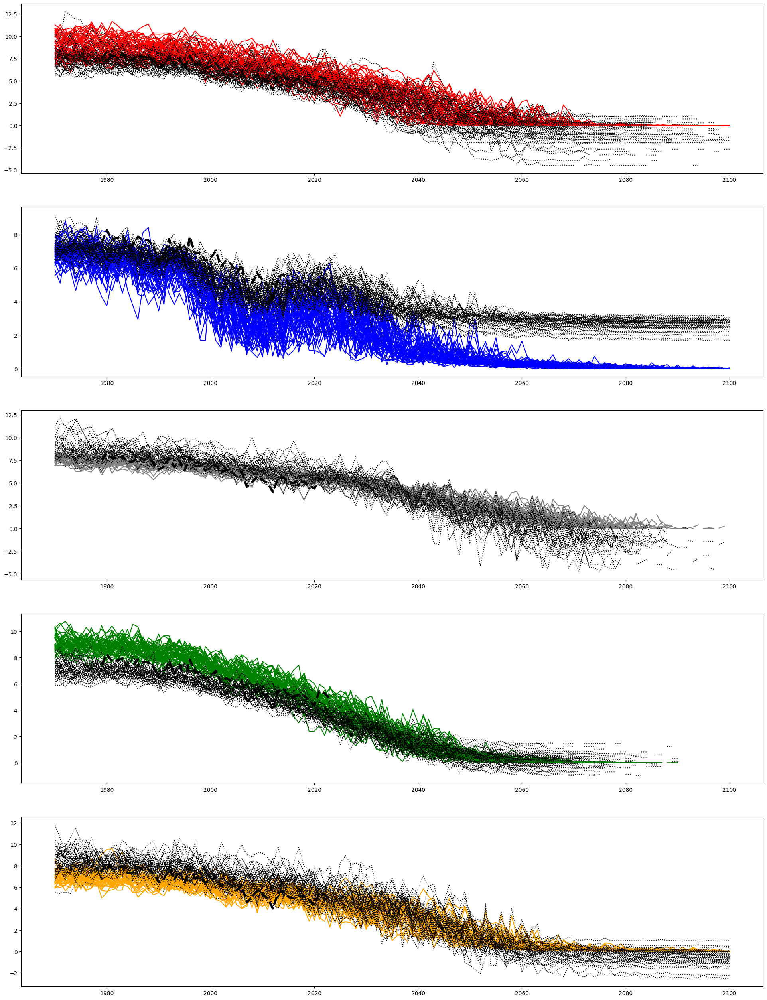

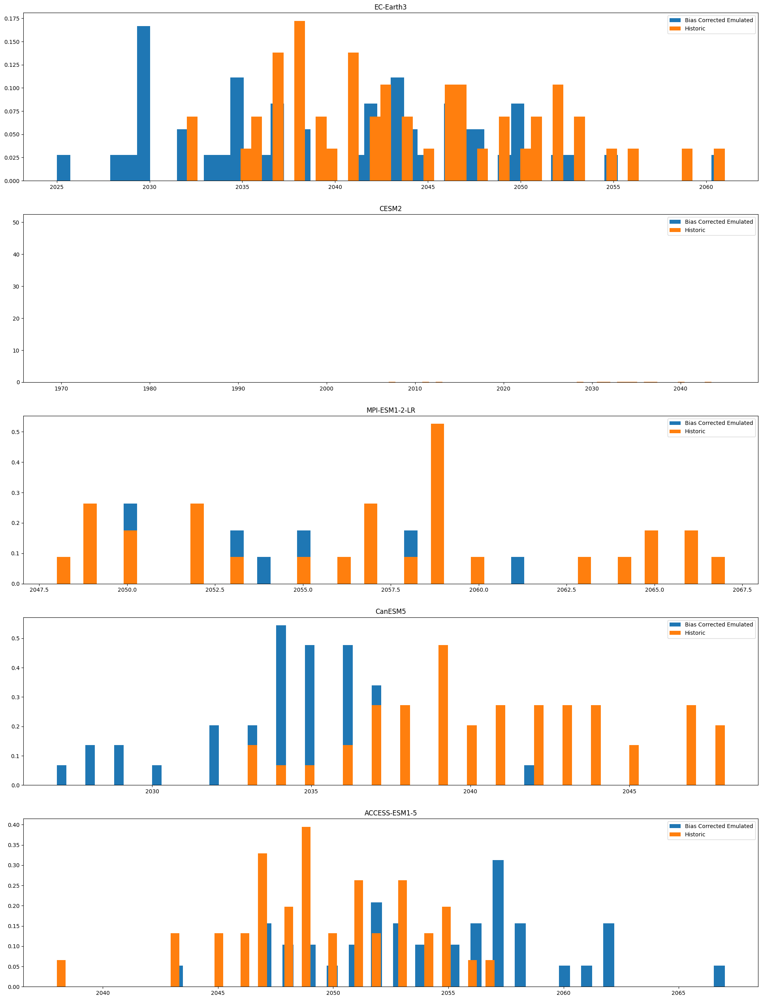

In [146]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(24, 32))
axes = axes.flatten()

for i, ax in enumerate(axes):
    model_name = MODEL_NAMES[i]
    model_color = MODEL_COLOURS[model_name]

    emulated_ice_free_years = bias_corrected_icefree_years[model_name].dt.year

    ax.hist(emulated_ice_free_years, bins=50, density=True, label="Bias Corrected Emulated")
    ax.hist(model_ensemble_icefree_years[model_name].dt.year, bins=50, density=True, label="Historic")
    ax.set_title(model_name)
    ax.legend()

## Gaussian Processes

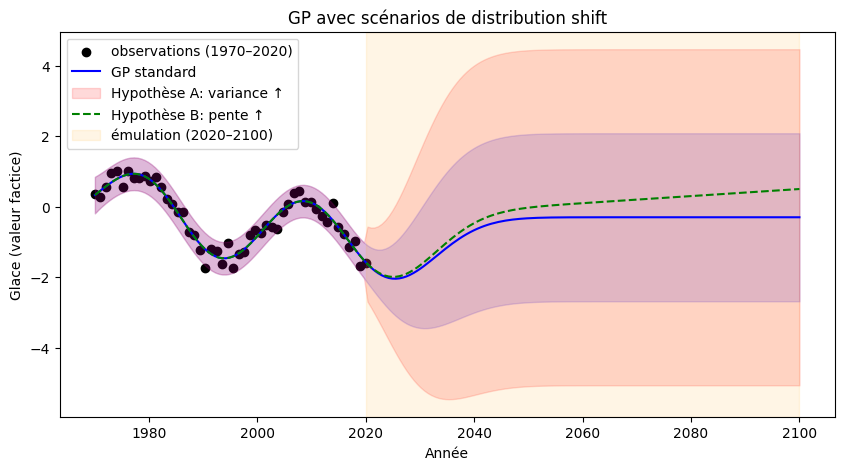

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, WhiteKernel

# --- Données factices ---
rng = np.random.RandomState(0)
X_train = np.linspace(1970, 2020, 50).reshape(-1, 1)
y_train = -0.02*(X_train.ravel()-1970) + np.sin((X_train.ravel()-1970)/5) \
          + rng.normal(0, 0.2, X_train.shape[0])

# --- GP standard entraîné sur 1970–2020 ---
kernel = C(1.0) * RBF(20.0) + WhiteKernel(0.2)
gp = GaussianProcessRegressor(kernel=kernel, normalize_y=True)
gp.fit(X_train, y_train)

# --- Plage de prédiction ---
X_pred = np.linspace(1970, 2100, 200).reshape(-1, 1)
y_mean, y_std = gp.predict(X_pred, return_std=True)

# --- Hypothèse A : variance doublée après 2020 ---
y_std_A = y_std.copy()
mask = (X_pred.ravel() >= 2020)
y_std_A[mask] *= 2.0

# --- Hypothèse B : pente renforcée après 2020 ---
y_mean_B = y_mean.copy()
y_mean_B[mask] += 0.01 * (X_pred.ravel()[mask] - 2020)

# --- Visualisation ---
plt.figure(figsize=(10,5))
plt.scatter(X_train, y_train, c="k", label="observations (1970–2020)")

# GP standard
plt.plot(X_pred, y_mean, "b", label="GP standard")
plt.fill_between(X_pred.ravel(),
                 y_mean - 1.96*y_std,
                 y_mean + 1.96*y_std,
                 color="b", alpha=0.15)

# Hypothèse A
plt.fill_between(X_pred.ravel(),
                 y_mean - 1.96*y_std_A,
                 y_mean + 1.96*y_std_A,
                 color="red", alpha=0.15, label="Hypothèse A: variance ↑")

# Hypothèse B
plt.plot(X_pred, y_mean_B, "g--", label="Hypothèse B: pente ↑")

plt.axvspan(2020, 2100, color="orange", alpha=0.1, label="émulation (2020–2100)")
plt.xlabel("Année")
plt.ylabel("Glace (valeur factice)")
plt.legend()
plt.title("GP avec scénarios de distribution shift")
plt.show()


## Models

In [8]:
import random

from pandas import DatetimeIndex
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score


ensemble_colours = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b',
    '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#1f77b4', '#ff7f0e',
    '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
    '#bcbd22', '#17becf', '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728',
    '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b',
    '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', '#1f77b4', '#ff7f0e',
    '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
    '#bcbd22', '#17becf'
]

In [9]:
def select_ensembles(n: int, x: int) -> list[int]:
    return random.sample(range(n), x)

def select_remaining(n: int, selected_ensembles: list[int]) -> list[int]:
    return [i for i in range(n) if i not in selected_ensembles]

def get_x(model_name: str, x_vars: list[str], start_year: str, end_year: str) -> np.ndarray:
    xs = []
    for x_var in x_vars:
        xs.append(filter_by_years(model_data[x_var][model_name], start_year, end_year).to_numpy())
    return np.stack(xs)

def get_train_test_ensembles(n: int, train_split: float) -> tuple[list]:
    n_train = int(n * train_split)
    n_test = n - n_train

    train_ensembles = select_ensembles(n, n_train)
    test_ensembles = select_remaining(n, train_ensembles)

    return train_ensembles, test_ensembles

def get_x_train_test(
        x: np.ndarray,
        x_vars: list[str],
        train_ensembles: list[int],
        test_ensembles: list[int],
    ) -> tuple[np.array]:
    X_train = x[:, :, train_ensembles].reshape(-1, len(x_vars))
    X_test = x[:, :, test_ensembles].reshape(-1, len(x_vars))
    return X_train, X_test

def get_y_train_test(
        y_var: str,
        model_name: str,
        start_year: str,
        end_year: str,
        train_ensembles: list[int],
        test_ensembles: list[int],
    ) -> tuple[np.ndarray]:
    y = filter_by_years(model_data[y_var][model_name], start_year, end_year).to_numpy()
    y_train = y[:, train_ensembles].flatten()
    y_test = y[:, test_ensembles].flatten()
    return y_train, y_test

def get_regression(
        x_train: np.ndarray,
        y_train: np.ndarray,
        x_test: np.ndarray,
        y_test: np.ndarray,
        sample_weight: list[float] | None = None,
    ) -> dict:
    model = LinearRegression()
    model.fit(x_train, y_train, sample_weight=sample_weight)
    y_pred = model.predict(x_test)
    return {
        "y_pred": y_pred,
        "mse": mean_squared_error(y_test, y_pred),
        "r2": r2_score(y_test, y_pred),
        "model": model,
    }

def get_random_forest(
        x_train: np.ndarray,
        y_train: np.ndarray,
        x_test: np.ndarray,
        y_test: np.ndarray,
        sample_weight: list[float] | None = None,
        **rf_kwargs: dict,
    ) -> dict:
    model = RandomForestRegressor(**rf_kwargs)
    model.fit(x_train, y_train, sample_weight=sample_weight)
    y_pred = model.predict(x_test)
    return {
        "y_pred": y_pred,
        "mse": mean_squared_error(y_test, y_pred),
        "r2": r2_score(y_test, y_pred),
        "model": model,
    }

def get_reshaped(x: np.ndarray, nt: int, ensembles: list[int]) -> DataFrame:
    return DataFrame(x.reshape((nt, len(ensembles))), columns=ensembles)

def get_pred_plot(
        ax: "Axes",
        y_pred: np.ndarray,
        y_test: np.ndarray,
        test_ensembles: list[int],
        nt: int,
        model_name: str,
    ) -> None:
    y_pred_df = get_reshaped(y_pred, nt, test_ensembles)
    y_test_df = get_reshaped(y_test, nt, test_ensembles)

    y_pred_df.plot(ax=ax, color=ensemble_colours, legend=False, linestyle="--")
    y_test_df.plot(ax=ax, color=ensemble_colours, legend=False)

    ax.set_title(model_name)
    
def get_datetime_index(start_year: int, end_year: int) -> DatetimeIndex:
    dt_list = [
        f"{year}-01-01" for year in range(start_year, end_year+1)
    ]
    return DatetimeIndex(dt_list)

def get_emulated(
        x_vars: list[str],
        model: LinearRegression,
        start_year_emul: int,
        end_year_emul: int,
        train_ensembles: list[int],
        test_ensembles: list[int],
    ) -> DataFrame:
    X_emul_filtered = get_x(model_name, x_vars, start_year_emul, end_year_emul)
    _, X_emul = get_x_train_test(X_emul_filtered, x_vars, train_ensembles, test_ensembles)

    y_emul = model.predict(X_emul)

    y_emul_df = get_reshaped(y_emul, X_emul_filtered.shape[1], test_ensembles)
    y_emul_df.index = get_datetime_index(start_year_emul, end_year_emul)

    return y_emul_df

class TrainParams:

    def __init__(
            self,
            y_var: str,
            x_vars: list[str],
            train_split: float,
        ) -> None:
        self.y_var = y_var
        self.x_vars = x_vars
        self.train_split = train_split


def get_emulated_ice_free_years(
        train_params: TrainParams,
        model_name: str,
        n_iter: int,
        start_year: int,
        end_year: int,
        start_year_emul: int | None = None,
        end_year_emul: int = 2100
    ) -> list[int]:
    n_iter = 100

    if start_year_emul is None:
        start_year_emul = end_year + 1

    y_var = train_params.y_var
    x_vars = train_params.x_vars 
    train_split = train_params.train_split

    X = get_x(model_name, x_vars, start_year, end_year)

    ice_free_years_emul = []
    for _ in range(n_iter):
        train_ensembles, test_ensembles = get_train_test_ensembles(X.shape[-1], train_split)

        X_train, X_test = get_x_train_test(X, x_vars, train_ensembles, test_ensembles)
        y_train, y_test = get_y_train_test(y_var, model_name, start_year, earliest_ice_free_year, train_ensembles, test_ensembles)

        reg_res = get_regression(X_train, y_train, X_test, y_test)

        y_emul_df = get_emulated(
            x_vars, reg_res["model"],
            start_year_emul, end_year_emul,
            train_ensembles, test_ensembles,
        )

        ice_free_years_emul = [*ice_free_years_emul, *calculate_first_icefree_year(y_emul_df).dt.year.to_list()]

    return ice_free_years_emul

In [8]:
train_split = 0.8
y_var = "ssie"

start_year = "1970-01-01"

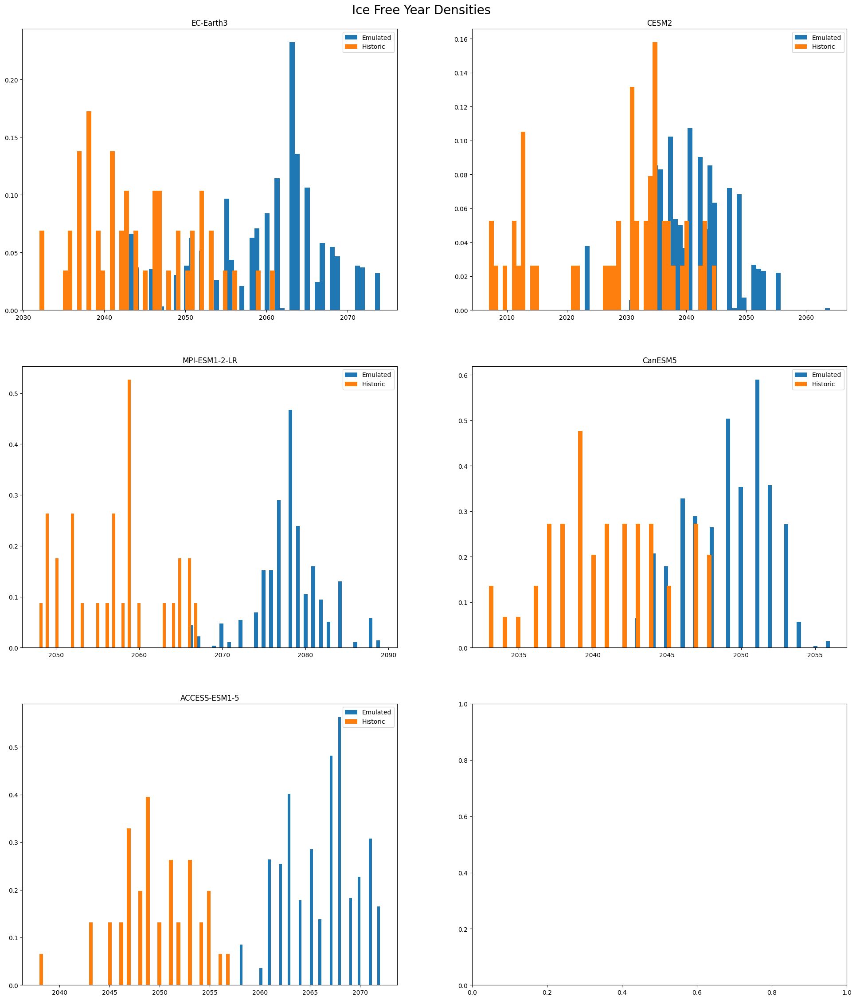

In [7]:
# ['EC-Earth3', 'CESM2', 'MPI-ESM1-2-LR', 'CanESM5', 'ACCESS-ESM1-5']

x_vars = ['tas'] # ['wsie', 'wsiv', 'tas', 'oht_atl', 'oht_pac', 'swfd', 'lwfd'] 
n_iter = 100

train_params = TrainParams(
    y_var=y_var,
    x_vars=x_vars,
    train_split=train_split,
)

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(24, 28))
axes = axes.flatten()

for i, model_name in enumerate(MODEL_NAMES):
    ax = axes[i]

    earliest_ice_free_year = model_ensemble_icefree_years[model_name].min().year
    emulated_ice_free_years = get_emulated_ice_free_years(
        train_params, model_name, n_iter, start_year, earliest_ice_free_year,
    )

    ax.hist(emulated_ice_free_years, bins=50, density=True, label="Emulated")
    ax.hist(model_ensemble_icefree_years[model_name].dt.year, bins=50, density=True, label="Historic")
    ax.legend()
    ax.set_title(model_name)
    
_ = fig.suptitle("Ice Free Year Densities", y=0.9, size=20)

In [10]:
train_split = 0.8
y_var = "ssie"
x_vars = ['tas'] # ['wsie', 'wsiv', 'tas', 'oht_atl', 'oht_pac', 'swfd', 'lwfd']


# model_name = "ACCESS-ESM1-5" # ['EC-Earth3', 'CESM2', 'MPI-ESM1-2-LR', 'CanESM5', 'ACCESS-ESM1-5']
start_year = 1970
end_year_emul = 2100


train_params = TrainParams(
    y_var=y_var,
    x_vars=x_vars,
    train_split=train_split,
)

Text(0.5, 0.9, 'Linear Regression Emulations')

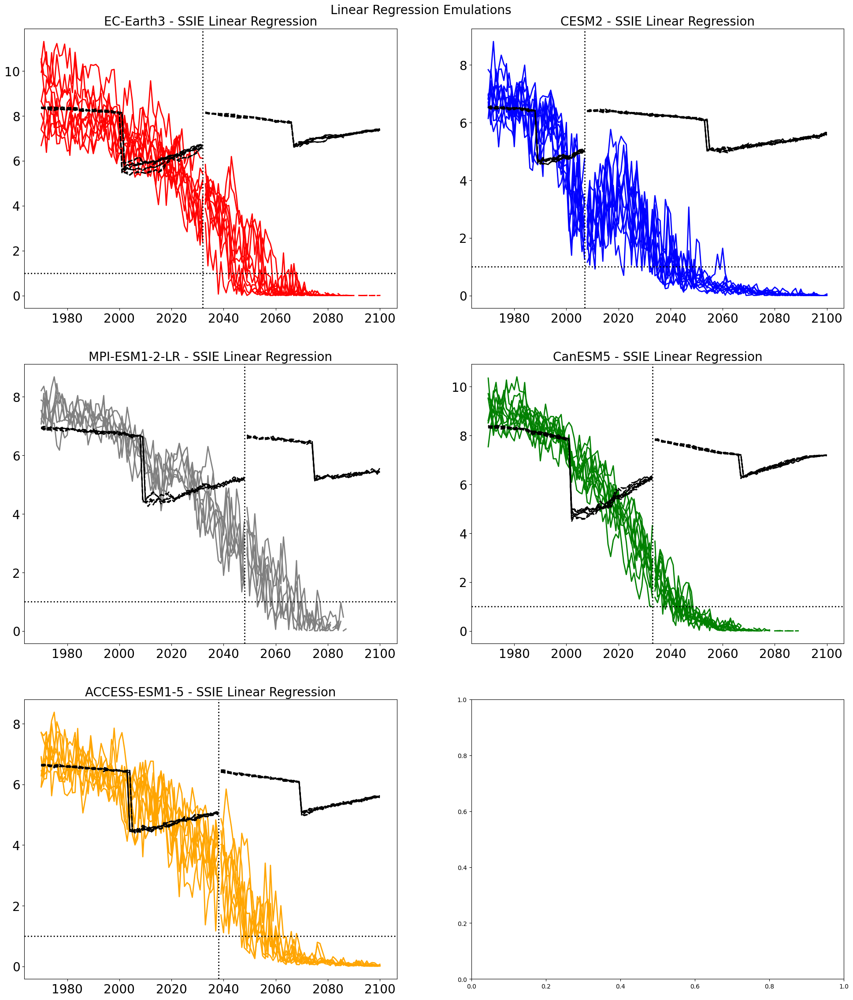

In [41]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(24, 28))
axes = axes.flatten()

ssie_obs = model_data["ssie"]["Observations"]

for i, model_name in enumerate(MODEL_NAMES):
    ax = axes[i]

    end_year = model_ensemble_icefree_years[model_name].min().year
    start_year_emul = end_year + 1

    X = get_x(model_name, x_vars, start_year, end_year)

    train_ensembles, test_ensembles = get_train_test_ensembles(X.shape[-1], train_split)

    X_train, X_test = get_x_train_test(X, x_vars, train_ensembles, test_ensembles)
    y_train, y_test = get_y_train_test(y_var, model_name, start_year, end_year, train_ensembles, test_ensembles)

    reg_res = get_regression(X_train, y_train, X_test, y_test)

    y_emul_df = get_emulated(
        x_vars, reg_res["model"],
        start_year_emul, end_year_emul,
        train_ensembles, test_ensembles,
    )

    y_emul_df_test = filter_by_years(model_data[y_var][model_name], start_year_emul, end_year_emul)

    y_test_preperiod = get_reshaped(y_test, X.shape[1], test_ensembles)
    y_test_preperiod.index = get_datetime_index(start_year, end_year)
    y_pred_preperiod = get_reshaped(reg_res["y_pred"], X.shape[1], test_ensembles)
    y_pred_preperiod.index = get_datetime_index(start_year, end_year)

    model_color = MODEL_COLOURS[model_name]

    mse_ens = mean_squared_error(
        y_test_preperiod,
        y_pred_preperiod,
        # multioutput="raw_values"
    )
    filter_index = ssie_obs.index[ssie_obs.index <= y_pred_preperiod.index.max()]

    obs_df = DataFrame({col: ssie_obs for col in y_pred_preperiod.columns})
    obs_df = obs_df.loc[filter_index]

    mse_obs = mean_squared_error(
        y_pred_preperiod.loc[filter_index],
        obs_df,
        # multioutput="raw_values",
    )

    # ax.text(Timestamp("2080-01-01"), 8, f"$MSE_E$={mse_ens:.2f}")
    # ax.text(Timestamp("2080-01-01"), 7.5, f"$MSE_O$={mse_obs:.2f}")
    
    ax.plot(y_test_preperiod, color=model_color, linewidth=2)
    ax.plot(y_pred_preperiod, color="black", linestyle="--", linewidth=2)
    
    ax.plot(y_emul_df_test[test_ensembles], color=model_color, linewidth=2)
    ax.plot(y_emul_df.clip(0), color="black", linestyle="--", linewidth=2)

    ax.plot([], [], color="black", linestyle="--", label="Model Prediction")
    ax.plot([], [], color=model_color, label="Ensemble Data")

    ax.axhline(y=1, color='black', linestyle=':', linewidth=2)
    ax.axvline(x=Timestamp(f"{end_year}-01-01"), color='black', linestyle=':', linewidth=2)
    # ax.legend()
    ax.set_title(f"{model_name} - SSIE Linear Regression", x=0.5, size=20)
    ax.tick_params(labelsize=20)

fig.suptitle("Linear Regression Emulations", y=0.9, size=20)

In [135]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CollinearityResistantNet(nn.Module):
    """
    Neural network designed to handle collinear features
    """
    def __init__(self, input_dim, hidden_dims=[128, 64, 32], 
                 output_dim=1, dropout_rate=0.3, use_batch_norm=True):
        super(CollinearityResistantNet, self).__init__()
        
        self.input_dim = input_dim
        self.hidden_dims = hidden_dims
        self.dropout_rate = dropout_rate
        self.use_batch_norm = use_batch_norm
        
        # Input layer with regularization
        self.input_layer = nn.Linear(input_dim, hidden_dims[0])
        self.input_bn = nn.BatchNorm1d(hidden_dims[0]) if use_batch_norm else None
        self.input_dropout = nn.Dropout(dropout_rate)
        
        # Hidden layers
        self.hidden_layers = nn.ModuleList()
        self.batch_norms = nn.ModuleList() if use_batch_norm else None
        self.dropouts = nn.ModuleList()
        
        for i in range(len(hidden_dims) - 1):
            self.hidden_layers.append(
                nn.Linear(hidden_dims[i], hidden_dims[i+1])
            )
            if use_batch_norm:
                self.batch_norms.append(nn.BatchNorm1d(hidden_dims[i+1]))
            self.dropouts.append(nn.Dropout(dropout_rate))
        
        # Output layer
        self.output_layer = nn.Linear(hidden_dims[-1], output_dim)
        
        # Residual connection for the first layer
        self.residual = nn.Linear(input_dim, hidden_dims[0]) if input_dim == hidden_dims[0] else None
        
        # Initialize weights with appropriate regularization
        self._initialize_weights()
    
    def _initialize_weights(self):
        """Initialize weights with Xavier initialization and small bias"""
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_normal_(m.weight)
                nn.init.constant_(m.bias, 0.01)
    
    def forward(self, x):
        # Input layer with optional residual connection
        identity = x
        
        out = self.input_layer(x)
        if self.use_batch_norm:
            out = self.input_bn(out)
        out = F.relu(out)
        out = self.input_dropout(out)
        
        # Add residual connection if dimensions match
        if self.residual is not None:
            residual_out = self.residual(identity)
            out = out + residual_out
        
        # Hidden layers
        for i, layer in enumerate(self.hidden_layers):
            identity = out  # Save for potential residual connection
            
            out = layer(out)
            if self.use_batch_norm and self.batch_norms is not None:
                out = self.batch_norms[i](out)
            out = F.relu(out)
            out = self.dropouts[i](out)
            
            # Simple residual connection if dimensions match
            if out.shape[1] == identity.shape[1]:
                out = out + identity
        
        # Output layer
        out = self.output_layer(out)
        return out

class EnhancedCollinearityNet(nn.Module):
    def __init__(self, input_dim, hidden_dims=[256, 128, 64], output_dim=1,
                 dropout_rates=[0.4, 0.3, 0.2], use_batch_norm=True,
                 use_skip_connections=True):
        super(EnhancedCollinearityNet, self).__init__()
        
        layers = []
        prev_dim = input_dim
        
        for i, hidden_dim in enumerate(hidden_dims):
            layers.append(nn.Linear(prev_dim, hidden_dim))
            
            if use_batch_norm:
                layers.append(nn.BatchNorm1d(hidden_dim))
            
            layers.append(nn.ReLU())
            layers.append(nn.Dropout(dropout_rates[min(i, len(dropout_rates)-1)]))
            
            if use_skip_connections and prev_dim == hidden_dim and i > 0:
                layers.append(ResidualBlock(hidden_dim))
            
            prev_dim = hidden_dim
        
        self.features = nn.Sequential(*layers)
        self.output = nn.Linear(hidden_dims[-1], output_dim)
    
    def forward(self, x):
        features = self.features(x)
        return self.output(features)

class ResidualBlock(nn.Module):
    def __init__(self, dim):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Linear(dim, dim),
            nn.ReLU(),
            nn.Linear(dim, dim)
        )
    
    def forward(self, x):
        return x + self.block(x)

def create_optimizer(model, learning_rate=0.001, weight_decay=1e-5):
    return torch.optim.AdamW(
        model.parameters(), 
        lr=learning_rate, 
        weight_decay=weight_decay
    )

def train_model(model, train_loader, val_loader, num_epochs=100, patience=10):
    """Training function with early stopping"""
    optimizer = create_optimizer(model)
    criterion = nn.MSELoss()
    
    best_val_loss = float('inf')
    patience_counter = 0
    
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        train_loss = 0
        for batch_x, batch_y in train_loader:
            optimizer.zero_grad()
            predictions = model(batch_x)
            loss = criterion(predictions, batch_y)
            loss.backward()
            
            # Gradient clipping to prevent explosion
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            
            optimizer.step()
            train_loss += loss.item()
        
        # Validation phase
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for batch_x, batch_y in val_loader:
                predictions = model(batch_x)
                loss = criterion(predictions, batch_y)
                val_loss += loss.item()
        
        # Early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            # Save best model
            torch.save(model.state_dict(), 'best_model.pth')



In [136]:
from torch.utils.data import DataLoader, TensorDataset

# class ArcticDataset(Dataset):
#     def __init__(self, x, y):
#         self.x = x
#         self.y = y

#     def __len__(self):
#         return len(self.y)

#     def __getitem__(self, idx):
#         return self.x[idx], self.y[idx]

train_dataset = TensorDataset(torch.tensor(X_train, dtype=torch.float32), torch.tensor(y_train, dtype=torch.float32).view(-1, 1))
test_dataset = TensorDataset(torch.tensor(X_test, dtype=torch.float32), torch.tensor(y_test, dtype=torch.float32).view(-1, 1))

train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=64, shuffle=True)

In [137]:
input_dim = 4
hidden_dims = [256, 128, 64]
output_dim = 1

# Create model
model = EnhancedCollinearityNet(
    input_dim=input_dim,
    hidden_dims=hidden_dims,
    output_dim=output_dim,
    dropout_rates=[0.4, 0.3, 0.2],
    use_batch_norm=True,
    use_skip_connections=True
)

train_model(model, train_dataloader, test_dataloader)
    

In [132]:
import torch
import torch.nn as nn
import torch.optim as optim

model_name = "ACCESS-ESM1-5"
x_vars = ['tas', 'wsiv', 'oht_pac', 'oht_atl'] # ['wsie', 'wsiv', 'tas', 'oht_atl', 'oht_pac', 'swfd', 'lwfd']

# Réseau simple : 1 -> 32 -> 16 -> 1
class Net(nn.Module):
    def __init__(self, input_dim=4, hidden_dim=16, bottleneck_dim=2):
        super(Net, self).__init__()
        self.dropout = nn.Dropout(p=0.3)  # réduit dépendance sur corrélations
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, bottleneck_dim)  # bottleneck
        self.fc3 = nn.Linear(bottleneck_dim, 1)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.dropout(x)
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# Exemple d’utilisation
input_dim = len(x_vars)   # nombre de features
model = Net(input_dim)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(24, 28))
# axes = axes.flatten()

ssie_obs = model_data["ssie"]["Observations"]

# for i, model_name in enumerate(MODEL_NAMES):
#     ax = axes[i]

end_year = model_ensemble_icefree_years[model_name].min().year
start_year_emul = end_year + 1

X = get_x(model_name, x_vars, start_year, end_year)

train_ensembles, test_ensembles = get_train_test_ensembles(X.shape[-1], train_split)

X_train, X_test = get_x_train_test(X, x_vars, train_ensembles, test_ensembles)
y_train, y_test = get_y_train_test(y_var, model_name, start_year, end_year, train_ensembles, test_ensembles)


for epoch in range(1000):

    optimizer.zero_grad()
    preds = model(torch.tensor(X_train, dtype=torch.float).unsqueeze(1))
    loss = criterion(preds, torch.tensor(y_train, dtype=torch.float))
    loss.backward()
    optimizer.step()

    if epoch % 100 == 0:
        print(f"Epoch {epoch}, Loss = {loss.item():.4f}")



c:\Users\bensi\pyIMT\icefreearcticml\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([2208])) that is different to the input size (torch.Size([2208, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch 0, Loss = 37.1742
Epoch 100, Loss = 11.4600
Epoch 200, Loss = 10.2916
Epoch 300, Loss = 9.4101
Epoch 400, Loss = 8.4813
Epoch 500, Loss = 7.4646
Epoch 600, Loss = 6.2899
Epoch 700, Loss = 4.6870
Epoch 800, Loss = 3.3801
Epoch 900, Loss = 2.4793


In [50]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor


# Régression multiple
model = sm.OLS(y_train, X_train).fit()
print(model.summary())

# Calcul du VIF
vif = pd.DataFrame()
vif["variable"] = x_vars
vif["VIF"] = [variance_inflation_factor(X_train, i) for i in range(X_train.shape[1])]
print(vif)


                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.159
Model:                            OLS   Adj. R-squared (uncentered):              0.157
Method:                 Least Squares   F-statistic:                              104.0
Date:                Thu, 04 Sep 2025   Prob (F-statistic):                    3.09e-81
Time:                        12:28:52   Log-Likelihood:                         -6821.1
No. Observations:                2208   AIC:                                  1.365e+04
Df Residuals:                    2204   BIC:                                  1.367e+04
Df Model:                           4                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [138]:
state_dict = torch.load("best_model.pth")
model.load_state_dict(state_dict)

<All keys matched successfully>

In [139]:
X_emul_filtered = get_x(model_name, x_vars, start_year_emul, end_year_emul)
_, X_emul = get_x_train_test(X_emul_filtered, x_vars, train_ensembles, test_ensembles)

y_emul = model(torch.tensor(X_emul, dtype=torch.float))

y_emul_df = get_reshaped(y_emul.detach().numpy(), X_emul_filtered.shape[1], test_ensembles)
y_emul_df.index = get_datetime_index(start_year_emul, end_year_emul)

y_emul_df_test = filter_by_years(model_data[y_var][model_name], start_year_emul, end_year_emul)


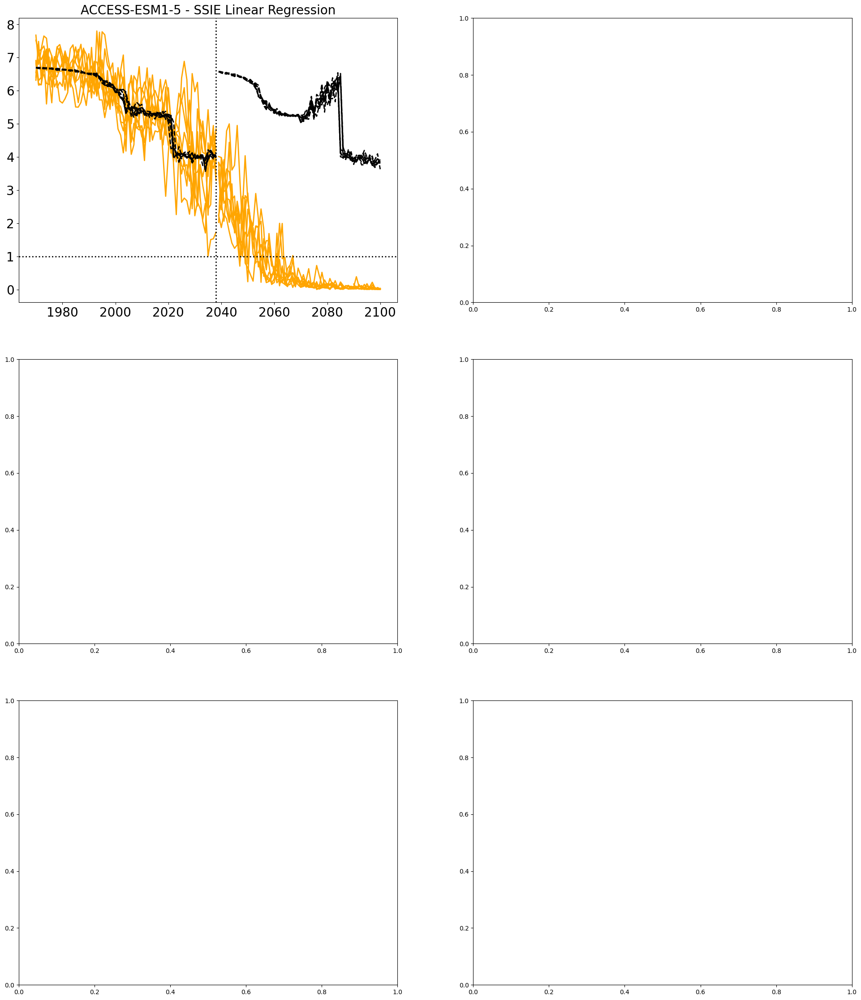

In [140]:
y_test_preperiod = get_reshaped(y_test, X.shape[1], test_ensembles)
y_test_preperiod.index = get_datetime_index(start_year, end_year)

y_pred = model(torch.tensor(X_test, dtype=torch.float))

y_pred_preperiod = get_reshaped(y_pred.detach().numpy(), X.shape[1], test_ensembles)
y_pred_preperiod.index = get_datetime_index(start_year, end_year)

    # model_color = MODEL_COLOURS[model_name]

    # mse_ens = mean_squared_error(
    #     y_test_preperiod,
    #     y_pred_preperiod,
    #     # multioutput="raw_values"
    # )
    # filter_index = ssie_obs.index[ssie_obs.index <= y_pred_preperiod.index.max()]

    # obs_df = DataFrame({col: ssie_obs for col in y_pred_preperiod.columns})
    # obs_df = obs_df.loc[filter_index]

    # mse_obs = mean_squared_error(
    #     y_pred_preperiod.loc[filter_index],
    #     obs_df,
    #     # multioutput="raw_values",
    # )

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(24, 28))
axes = axes.flatten()

ax = axes[0]

model_color = MODEL_COLOURS[model_name]

ax.plot(y_test_preperiod, color=model_color, linewidth=2)
ax.plot(y_pred_preperiod, color="black", linestyle="--", linewidth=2)

ax.plot(y_emul_df_test[test_ensembles], color=model_color, linewidth=2)
ax.plot(y_emul_df.clip(0), color="black", linestyle="--", linewidth=2)

ax.plot([], [], color="black", linestyle="--", label="Model Prediction")
ax.plot([], [], color=model_color, label="Ensemble Data")

ax.axhline(y=1, color='black', linestyle=':', linewidth=2)
ax.axvline(x=Timestamp(f"{end_year}-01-01"), color='black', linestyle=':', linewidth=2)
# ax.legend()
ax.set_title(f"{model_name} - SSIE Linear Regression", x=0.5, size=20)
ax.tick_params(labelsize=20)

# fig.suptitle("Linear Regression Emulations", y=0.9, size=20)




In [60]:
x_vars

['tas', 'wsiv', 'oht_pac', 'oht_atl']

Text(0.5, 0.9, 'Random Forest Emulations')

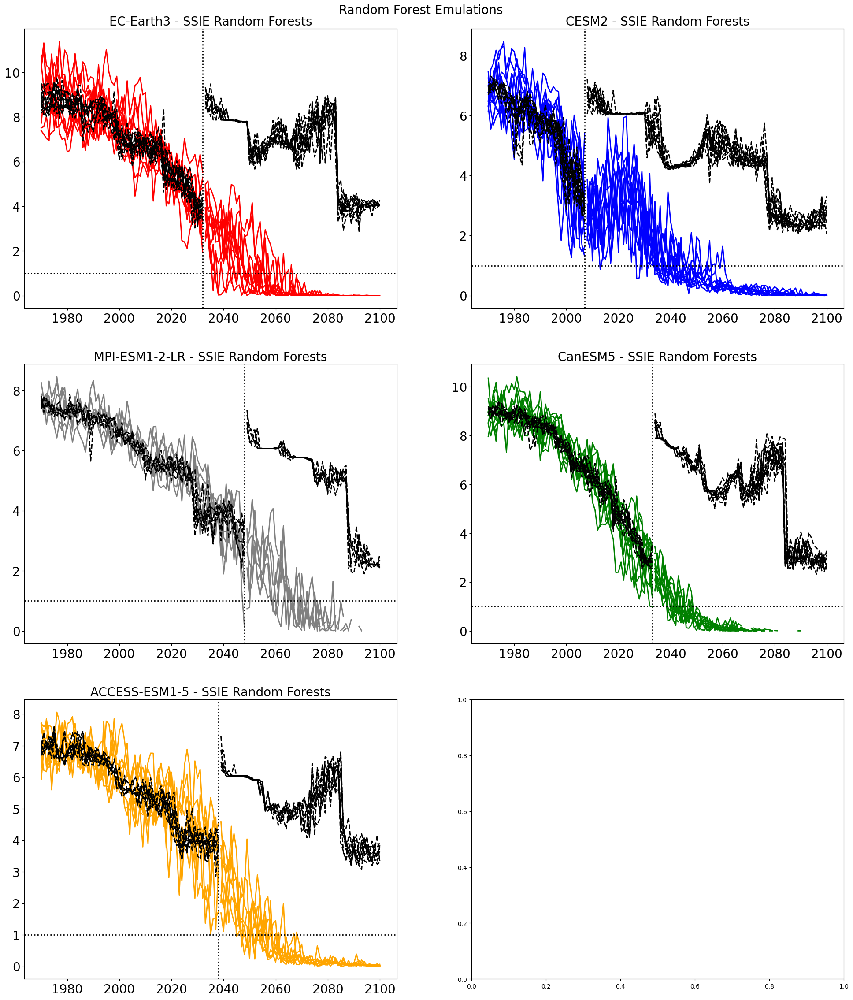

In [61]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(24, 28))
axes = axes.flatten()

for i, model_name in enumerate(MODEL_NAMES):
    ax = axes[i]

    end_year = model_ensemble_icefree_years[model_name].min().year
    start_year_emul = end_year + 1

    X = get_x(model_name, x_vars, start_year, end_year)

    train_ensembles, test_ensembles = get_train_test_ensembles(X.shape[-1], train_split)

    X_train, X_test = get_x_train_test(X, x_vars, train_ensembles, test_ensembles)
    y_train, y_test = get_y_train_test(y_var, model_name, start_year, end_year, train_ensembles, test_ensembles)

    reg_res = get_random_forest(X_train, y_train, X_test, y_test)

    y_emul_df = get_emulated(
        x_vars, reg_res["model"],
        start_year_emul, end_year_emul,
        train_ensembles, test_ensembles,
    )

    y_emul_df_test = filter_by_years(model_data[y_var][model_name], start_year_emul, end_year_emul)

    y_test_preperiod = get_reshaped(y_test, X.shape[1], test_ensembles)
    y_test_preperiod.index = get_datetime_index(start_year, end_year)
    y_pred_preperiod = get_reshaped(reg_res["y_pred"], X.shape[1], test_ensembles)
    y_pred_preperiod.index = get_datetime_index(start_year, end_year)


    mse_ens = mean_squared_error(
        y_test_preperiod,
        y_pred_preperiod,
        # multioutput="raw_values"
    )
    filter_index = ssie_obs.index[ssie_obs.index <= y_pred_preperiod.index.max()]

    obs_df = DataFrame({col: ssie_obs for col in y_pred_preperiod.columns})
    obs_df = obs_df.loc[filter_index]

    mse_obs = mean_squared_error(
        y_pred_preperiod.loc[filter_index],
        obs_df,
        # multioutput="raw_values",
    )

    model_color = MODEL_COLOURS[model_name]
    
    ax.plot(y_test_preperiod, color=model_color, linewidth=2)
    ax.plot(y_pred_preperiod, color="black", linestyle="--", linewidth=2)
    
    ax.plot(y_emul_df_test[test_ensembles], color=model_color, linewidth=2)
    ax.plot(y_emul_df, color="black", linestyle="--", linewidth=2)

    ax.plot([], [], color="black", linestyle="--", label="Model Prediction")
    ax.plot([], [], color=model_color, label="Ensemble Data")

    # ax.text(Timestamp("2080-01-01"), 8, f"$MSE_E$={mse_ens:.2f}")
    # ax.text(Timestamp("2080-01-01"), 7.5, f"$MSE_O$={mse_obs:.2f}")

    ax.axhline(y=1, color='black', linestyle=':', linewidth=2)
    ax.axvline(x=Timestamp(f"{end_year}-01-01"), color='black', linestyle=':', linewidth=2)
    # ax.legend()
    ax.tick_params(labelsize=20)
    # ax.set_title(model_name, x=0.5)
    ax.set_title(f"{model_name} - SSIE Random Forests", x=0.5, size=20)
    ax.tick_params(labelsize=20)

fig.suptitle("Random Forest Emulations", y=0.9, size=20)

## Domain Adaptation

In [163]:
from adapt.instance_based import TrAdaBoostR2

X = get_x(model_name, x_vars, start_year, end_year)
X_ood = get_x(model_name, x_vars, start_year_emul, end_year_emul)

train_ensembles, test_ensembles = get_train_test_ensembles(X.shape[-1], train_split)

X_train, X_test = get_x_train_test(X, x_vars, train_ensembles, test_ensembles)
X_ood_train, X_ood_test = get_x_train_test(X_ood, x_vars, train_ensembles, test_ensembles)

y_train, y_test = get_y_train_test(y_var, model_name, start_year, end_year, train_ensembles, test_ensembles)
y_ood_train, y_ood_test = get_y_train_test(y_var, model_name, start_year_emul, end_year_emul, train_ensembles, test_ensembles)

Xs, ys, Xt, yt = X_train, y_train, X_ood_train, y_ood_train
tgt_index_lab_ = np.random.choice(X_ood_train.shape[0], int(X_ood_train.shape[0] * 0.01))
Xt_lab = Xt[tgt_index_lab_]; yt_lab = yt[tgt_index_lab_]

import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Input, Dense, Reshape
from tensorflow.keras.optimizers import Adam

# def get_model():
#     model = Sequential()
#     model.add(Dense(100, activation='elu', input_shape=(1,)))
#     model.add(Dense(100, activation='relu'))
#     model.add(Dense(1))
#     model.compile(optimizer=Adam(0.01), loss='mean_squared_error')
#     return model

def get_model():
    return RandomForestRegressor()

model = TrAdaBoostR2(get_model(), n_estimators=50, random_state=0)

model.fit(
    Xs.reshape(-1, 1),
    ys.reshape(-1, 1),
    Xt_lab.reshape(-1, 1),
    yt_lab.reshape(-1, 1),
)

Iteration 0 - Error: 0.0658
Iteration 1 - Error: 0.1287
Iteration 2 - Error: 0.1674
Iteration 3 - Error: 0.1905
Iteration 4 - Error: 0.3384
Iteration 5 - Error: 0.3097
Iteration 6 - Error: 0.2420
Iteration 7 - Error: 0.3720
Iteration 8 - Error: 0.3646
Iteration 9 - Error: 0.3836
Iteration 10 - Error: 0.4129
Iteration 11 - Error: 0.3299
Iteration 12 - Error: 0.3068
Iteration 13 - Error: 0.3598
Iteration 14 - Error: 0.4747
Iteration 15 - Error: 0.4500
Iteration 16 - Error: 0.4021
Iteration 17 - Error: 0.4241
Iteration 18 - Error: 0.3563
Iteration 19 - Error: 0.3749
Iteration 20 - Error: 0.2398
Iteration 21 - Error: 0.2920
Iteration 22 - Error: 0.3334
Iteration 23 - Error: 0.3261
Iteration 24 - Error: 0.3795
Iteration 25 - Error: 0.3985
Iteration 26 - Error: 0.3331
Iteration 27 - Error: 0.3371
Iteration 28 - Error: 0.3127
Iteration 29 - Error: 0.3514
Iteration 30 - Error: 0.3099
Iteration 31 - Error: 0.3903
Iteration 32 - Error: 0.3451
Iteration 33 - Error: 0.3832
Iteration 34 - Error: 0.

,estimator,RandomForestRegressor()
,Xt,None
,yt,None
,n_estimators,50
,lr,1.0
,copy,True
,verbose,1
,random_state,0
,n_estimators,100
,criterion,'squared_error'
,max_depth,None


In [164]:
yt_pred = model.predict(X_ood_test.reshape(-1, 1))

y_emul_df = get_reshaped(yt_pred, 62, test_ensembles)
y_emul_df.index = get_datetime_index(start_year_emul, end_year_emul)

In [165]:
y_test_preperiod = get_reshaped(y_test, X.shape[1], test_ensembles)
y_test_preperiod.index = get_datetime_index(start_year, end_year)

y_pred = model.predict(X_test)

y_pred_preperiod = get_reshaped(y_pred, X.shape[1], test_ensembles)
y_pred_preperiod.index = get_datetime_index(start_year, end_year)

y_emul_df_test = filter_by_years(model_data[y_var][model_name], start_year_emul, end_year_emul)


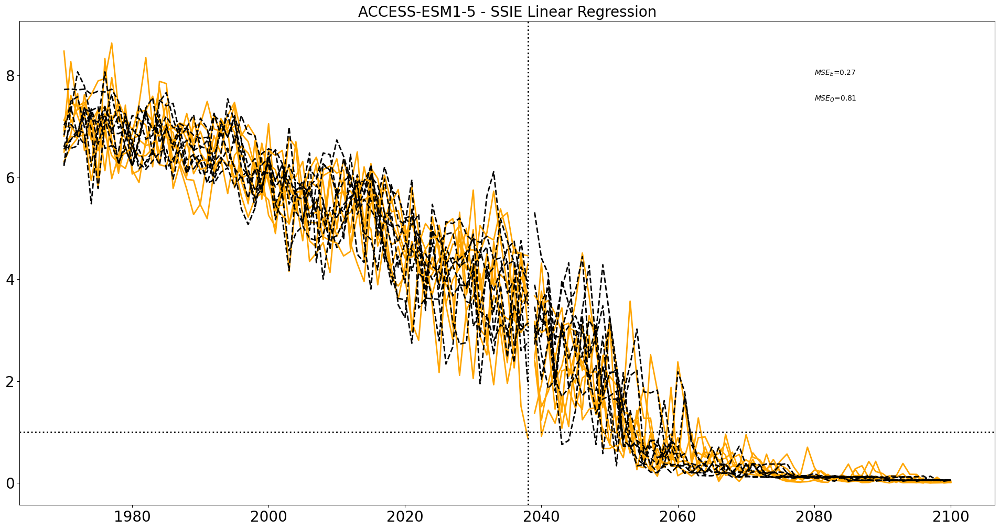

In [166]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(24, 12))
# axes = axes.flatten()

ax = axes

ax.text(Timestamp("2080-01-01"), 8, f"$MSE_E$={mse_ens:.2f}")
ax.text(Timestamp("2080-01-01"), 7.5, f"$MSE_O$={mse_obs:.2f}")

ax.plot(y_test_preperiod, color=model_color, linewidth=2)
ax.plot(y_pred_preperiod, color="black", linestyle="--", linewidth=2)

ax.plot(y_emul_df_test[test_ensembles], color=model_color, linewidth=2)
ax.plot(y_emul_df.clip(0), color="black", linestyle="--", linewidth=2)

ax.plot([], [], color="black", linestyle="--", label="Model Prediction")
ax.plot([], [], color=model_color, label="Ensemble Data")

ax.axhline(y=1, color='black', linestyle=':', linewidth=2)
ax.axvline(x=Timestamp(f"{end_year}-01-01"), color='black', linestyle=':', linewidth=2)
# ax.legend()
ax.set_title(f"{model_name} - SSIE Linear Regression", x=0.5, size=20)
ax.tick_params(labelsize=20)

## Normalising Flows

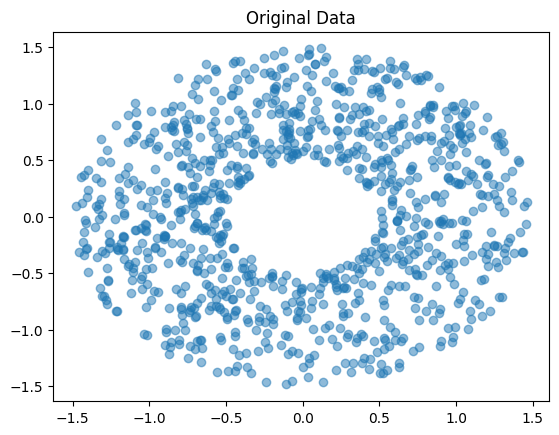

TypeError: randn() received an invalid combination of arguments - got (tuple, device=torch.device, dtype=torch.dtype), but expected one of:
 * (tuple of ints size, *, torch.Generator generator, tuple of names names, torch.dtype dtype = None, torch.layout layout = None, torch.device device = None, bool pin_memory = False, bool requires_grad = False)
 * (tuple of ints size, *, torch.Generator generator, Tensor out = None, torch.dtype dtype = None, torch.layout layout = None, torch.device device = None, bool pin_memory = False, bool requires_grad = False)
 * (tuple of ints size, *, Tensor out = None, torch.dtype dtype = None, torch.layout layout = None, torch.device device = None, bool pin_memory = False, bool requires_grad = False)
 * (tuple of ints size, *, tuple of names names, torch.dtype dtype = None, torch.layout layout = None, torch.device device = None, bool pin_memory = False, bool requires_grad = False)


In [173]:
import torch
import torch.nn as nn
import normflows as nf
import matplotlib.pyplot as plt

# -----------------------------
# 1. Create some toy 2D data
# -----------------------------
n_samples = 1000
theta = 2 * torch.pi * torch.rand(n_samples)
r = 0.5 + torch.rand(n_samples)
x = torch.stack([r * torch.cos(theta), r * torch.sin(theta)], dim=1)  # circular pattern

plt.scatter(x[:,0], x[:,1], alpha=0.5)
plt.title("Original Data")
plt.show()

# -----------------------------
# 2. Define a base distribution
# -----------------------------
base_dist = nf.distributions.DiagGaussian(2)  # standard 2D Gaussian

# -----------------------------
# 3. Define flow transforms
# -----------------------------
transforms = []
for _ in range(5):  # 5 layers of planar flows
    transforms.append(nf.flows.Planar(2))

target = nf.distributions.TwoModes(2, 0.1)

flow = nf.NormalizingFlow(q0=base_dist, flows=transforms, p=target)

# -----------------------------
# 4. Train the flow
# -----------------------------
optimizer = torch.optim.Adam(flow.parameters(), lr=1e-2)
n_epochs = 1000

for epoch in range(n_epochs):
    optimizer.zero_grad()
    loss = flow.reverse_kld(x)  # maximize likelihood
    loss.backward()
    optimizer.step()
    if (epoch+1) % 200 == 0:
        print(f"Epoch {epoch+1}, loss = {loss.item():.4f}")

# -----------------------------
# 5. Transform to base distribution
# -----------------------------
z = flow._transform(x)  # maps x -> base distribution
plt.scatter(z[:,0].detach(), z[:,1].detach(), alpha=0.5)
plt.title("Mapped to Base Distribution")
plt.show()

# -----------------------------
# 6. Sample new data with different target distribution
# -----------------------------
# Example: uniform samples in [-1,1]^2
z_target = 2*torch.rand(n_samples, 2) - 1
x_new = flow._inverse(z_target)  # map to original data space
plt.scatter(x_new[:,0].detach(), x_new[:,1].detach(), alpha=0.5)
plt.title("New Data with Target Distribution")
plt.show()


c:\Users\bensi\pyIMT\icefreearcticml\.venv\Lib\site-packages\torch\functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\native\TensorShape.cpp:4324.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


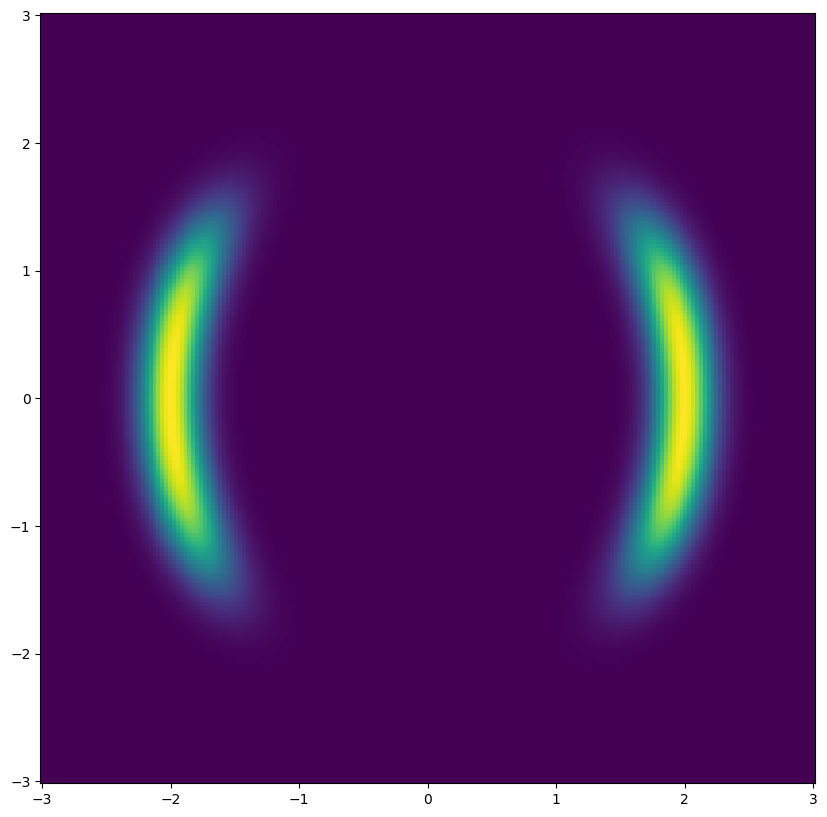

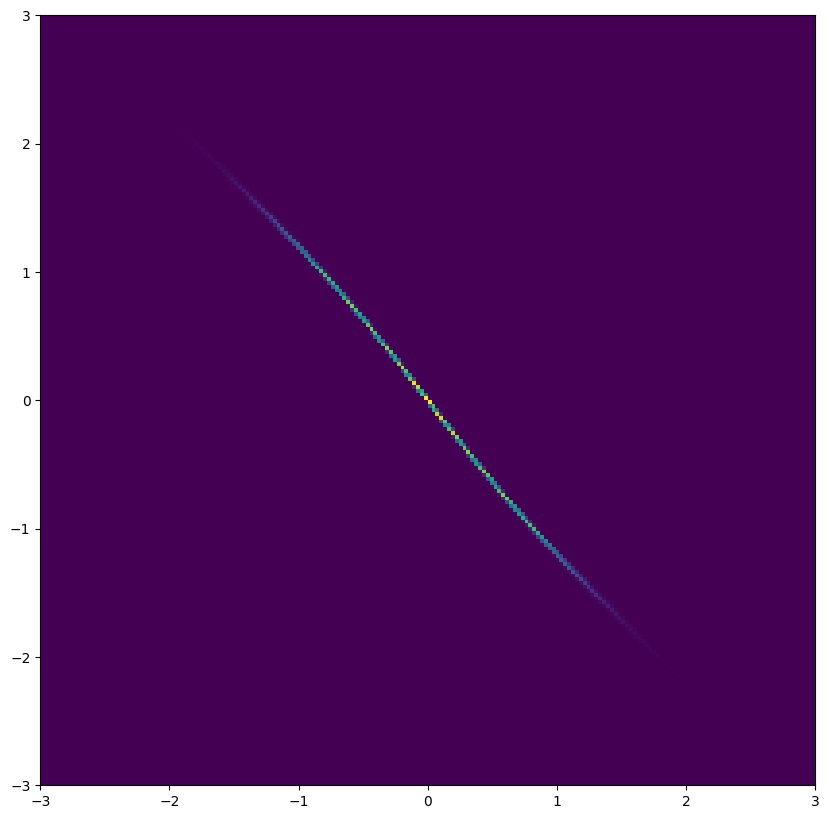

In [ ]:
# Import required packages
import torch
import numpy as np
import normflows as nf

from matplotlib import pyplot as plt

K = 16
#torch.manual_seed(0)

# Move model on GPU if available
enable_cuda = True
device = torch.device('cuda' if torch.cuda.is_available() and enable_cuda else 'cpu')

flows = []
for i in range(K):
    flows += [nf.flows.Planar((2,))]
target = nf.distributions.TwoModes(2, 0.1)

q0 = nf.distributions.DiagGaussian(2)
nfm = nf.NormalizingFlow(q0=q0, flows=flows, p=target)
nfm.to(device)

# Plot target distribution
grid_size = 200
xx, yy = torch.meshgrid(torch.linspace(-3, 3, grid_size), torch.linspace(-3, 3, grid_size))
z = torch.cat([xx.unsqueeze(2), yy.unsqueeze(2)], 2).view(-1, 2)
log_prob = target.log_prob(z.to(device)).to('cpu').view(*xx.shape)
prob = torch.exp(log_prob)

plt.figure(figsize=(10, 10))
plt.pcolormesh(xx, yy, prob)
plt.show()

# Plot initial flow distribution
z, _ = nfm.sample(num_samples=2 ** 20)
z_np = z.to('cpu').data.numpy()
plt.figure(figsize=(10, 10))
plt.hist2d(z_np[:, 0].flatten(), z_np[:, 1].flatten(), (grid_size, grid_size), range=[[-3, 3], [-3, 3]])
plt.show()

# Train model
max_iter = 20000
num_samples = 2 * 20
anneal_iter = 10000
annealing = True
show_iter = 2000


loss_hist = np.array([])

optimizer = torch.optim.Adam(nfm.parameters(), lr=1e-3, weight_decay=1e-4)
for it in range(max_iter):
    optimizer.zero_grad()
    if annealing:
        loss = nfm.reverse_kld(num_samples, beta=np.min([1., 0.01 + it / anneal_iter]))
    else:
        loss = nfm.reverse_kld(num_samples)
    loss.backward()
    optimizer.step()
    
    loss_hist = np.append(loss_hist, loss.to('cpu').data.numpy())

# Plot learned distribution
z, _ = nfm.sample(num_samples=2 ** 20)
z_np = z.to('cpu').data.numpy()
plt.figure(figsize=(10, 10))
plt.hist2d(z_np[:, 0].flatten(), z_np[:, 1].flatten(), (grid_size, grid_size), range=[[-3, 3], [-3, 3]])
plt.show()

Data shape: torch.Size([2000, 2])
Sample mean: 1.961, sample std: 2.775

Starting training...
Iteration 1000/5000, Loss: -2.100
Iteration 2000/5000, Loss: -2.661
Iteration 3000/5000, Loss: -1.653
Iteration 4000/5000, Loss: -3.461
Iteration 5000/5000, Loss: -2.887
Training finished!


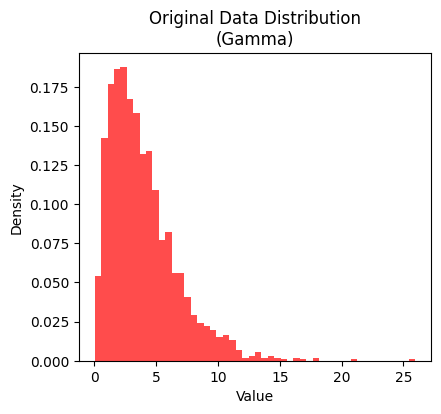

In [4]:
import torch
import numpy as np
import normflows as nf
from matplotlib import pyplot as plt
from scipy.stats import gamma, norm, kstest

# --- 1. Generate some non-Gaussian (Gamma) data ---
np.random.seed(0)
torch.manual_seed(0)

# Generate data from a Gamma distribution (highly non-Gaussian)
data_np = gamma(a=2, loc=0, scale=2).rvs(2000)
data = torch.tensor(data_np, dtype=torch.float32).reshape(-1, 1) # Shape [2000, 1]

# --- PAD THE DATA TO 2D ---
# Create a dummy second dimension filled with zeros
dummy_dim = torch.zeros_like(data)
# Now our data has shape [2000, 2]
data = torch.cat([data, dummy_dim], dim=1)

print(f"Data shape: {data.shape}")
print(f"Sample mean: {data.mean().item():.3f}, sample std: {data.std().item():.3f}")

# --- 2. Plot the original data ---
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(data_np, bins=50, density=True, alpha=0.7, color='red')
plt.title('Original Data Distribution\n(Gamma)')
plt.xlabel('Value')
plt.ylabel('Density')

# --- 3. Define the Normalizing Flow Model ---
# Base distribution (the Gaussian we want to transform TO)
base = nf.distributions.base.DiagGaussian(2) # 1D Gaussian

# Define the flow model. Let's use a Neural Spline Flow for its expressiveness.
# We'll create a list of flows (transformations)
num_layers = 10
flows = []
for i in range(num_layers):
    # Define a neural network for the conditioner
    param_map = nf.nets.MLP([1, 32, 32, 2]) # Outputs parameters for the spline
    # Add a affine coupling layer
    flows.append(nf.flows.AffineCouplingBlock(param_map))
    # Add permutation to ensure all dimensions can interact
    flows.append(nf.flows.Permute(1, mode='swap'))
    
model = nf.NormalizingFlow(base, flows)

max_iter = 5000
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

# Training loop
loss_hist = np.array([])
model.train() # Set model to training mode

print("\nStarting training...")
for it in range(max_iter):
    optimizer.zero_grad() # Reset gradients
    
    # Compute the negative log likelihood loss
    loss = model.forward_kld(data) 
    
    # Check for NaN
    if not torch.isnan(loss):
        loss.backward() # Calculate gradients
        optimizer.step() # Update parameters
    
    # Record loss
    loss_hist = np.append(loss_hist, loss.detach().cpu().numpy())
    
    if (it + 1) % 1000 == 0:
        print(f"Iteration {it+1}/{max_iter}, Loss: {loss.item():.3f}")

print("Training finished!")



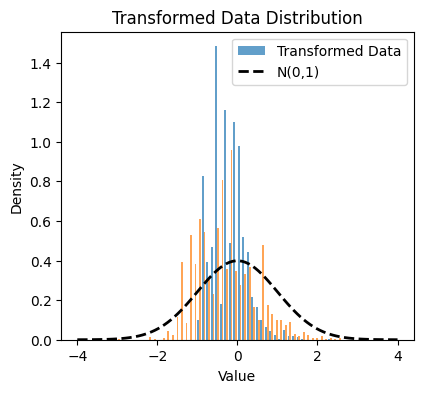

In [7]:
# --- 5. Transform the data to the Gaussian base distribution ---
model.eval() # Set model to evaluation mode
with torch.no_grad():
    # This is the key step: transform our data to the Gaussian base
    z = model.inverse(data)
    transformed_data = z.numpy()

# Plot the transformed data vs. a true Gaussian
plt.figure(figsize=(10, 4))

# Transformed data
plt.subplot(1, 2, 1)
plt.hist(transformed_data, bins=50, density=True, alpha=0.7, label='Transformed Data')
# Plot ideal Gaussian for comparison
x = np.linspace(-4, 4, 100)
plt.plot(x, norm.pdf(x, 0, 1), 'k--', linewidth=2, label='N(0,1)')
plt.title('Transformed Data Distribution')
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()

In [9]:
transformed_data.shape

(2000, 2)

In [8]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import normflows as nf

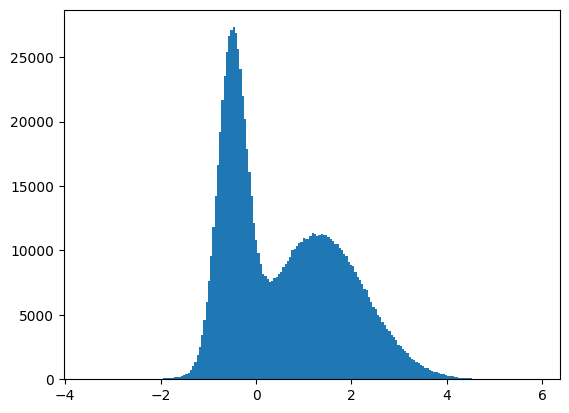

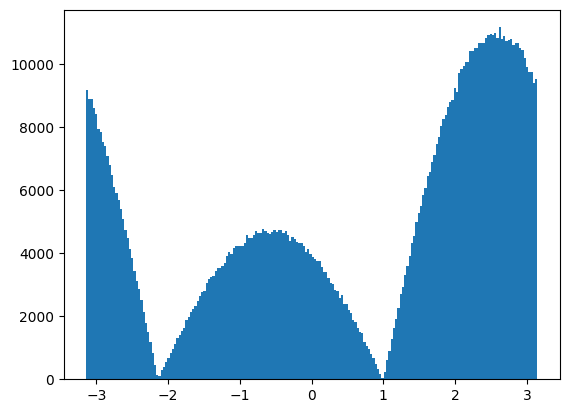

In [6]:

# Set up target
class Target:
    def __init__(self, ndim, ind_circ):
        self.ndim = ndim
        self.ind_circ = ind_circ  
    
    def sample(self, n):
        s = torch.randn(n, self.ndim)
        c = torch.rand(n, self.ndim) > 0.6
        s = c * (0.3 * s - 0.5) + (1 - 1. * c) * (s + 1.3)
        u = torch.rand(n, len(self.ind_circ))
        s_ = torch.acos(2 * u - 1)
        c = torch.rand(n, len(self.ind_circ)) > 0.3
        s_[c] = -s_[c]
        s[:, self.ind_circ] = (s_ + 1) % (2 * np.pi) - np.pi
        return s
    
# Visualize target
target = Target(2, [1])
s = target.sample(1000000)
plt.hist(s[:, 0].data.numpy(), bins=200)
plt.show()
plt.hist(s[:, 1].data.numpy(), bins=200)
plt.show()

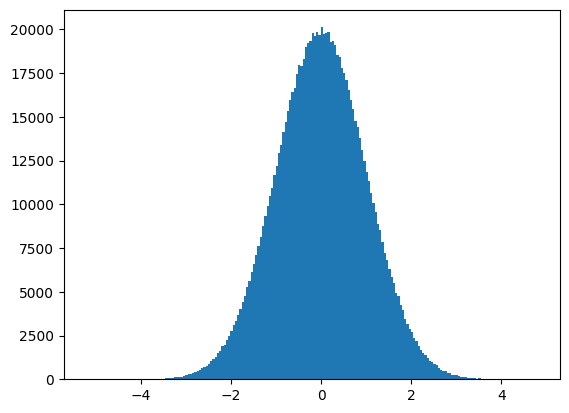

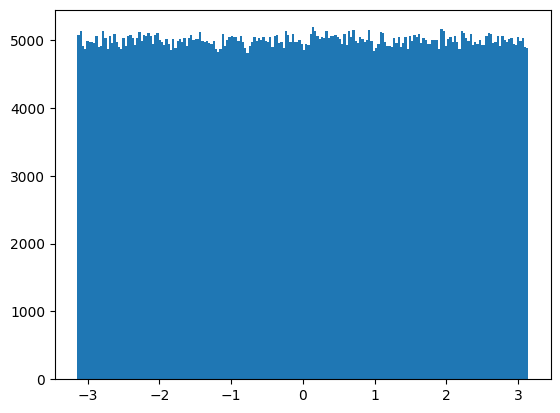

In [9]:
base = nf.distributions.UniformGaussian(2, [1], torch.tensor([1., 2 * np.pi]))

# Visualize base
s = base.sample(1000000)
plt.hist(s[:, 0].data.numpy(), bins=200)
plt.show()
plt.hist(s[:, 1].data.numpy(), bins=200)
plt.show()

In [10]:

# Create normalizing flow
K = 20

flow_layers = []
for i in range(K):
    flow_layers += [nf.flows.CircularAutoregressiveRationalQuadraticSpline(2, 1, 128, [1], 
                                                                           permute_mask=True)]

model = nf.NormalizingFlow(base, flow_layers)

# Move model on GPU if available
enable_cuda = True
device = torch.device('cuda' if torch.cuda.is_available() and enable_cuda else 'cpu')
model = model.to(device)

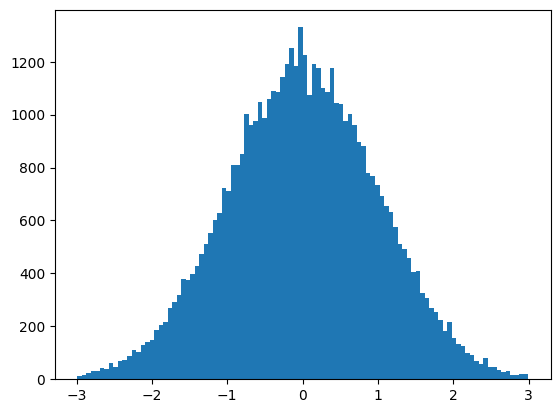

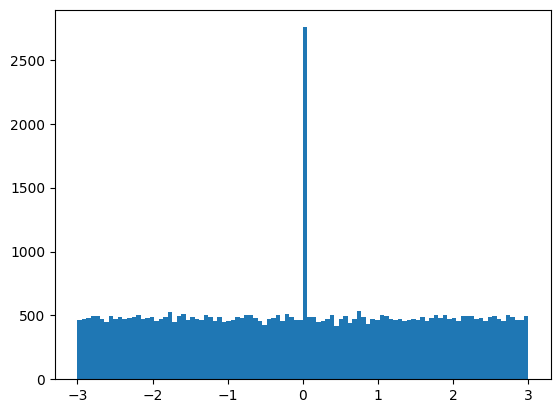

In [11]:
model.eval()
with torch.no_grad():
    s, _ = model.sample(50000)
model.train()
plt.hist(s[:, 0].cpu().data.numpy(), bins=100)
plt.show()
plt.hist(s[:, 1].cpu().data.numpy(), bins=100)
plt.show()

In [13]:
# Train model
max_iter = 20000
num_samples = 2 ** 10
show_iter = 5000


loss_hist = np.array([])

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)
for it in range(max_iter):
    optimizer.zero_grad()
    
    # Get training samples
    x = target.sample(num_samples)
    
    # Compute loss
    loss = model.forward_kld(x.to(device))
    
    # Do backprop and optimizer step
    if ~(torch.isnan(loss) | torch.isinf(loss)):
        loss.backward()
        optimizer.step()
    
    # Log loss
    loss_hist = np.append(loss_hist, loss.to('cpu').data.numpy())


# Plot loss
plt.figure(figsize=(10, 10))
plt.plot(loss_hist, label='loss')
plt.legend()
plt.show()

KeyboardInterrupt: 

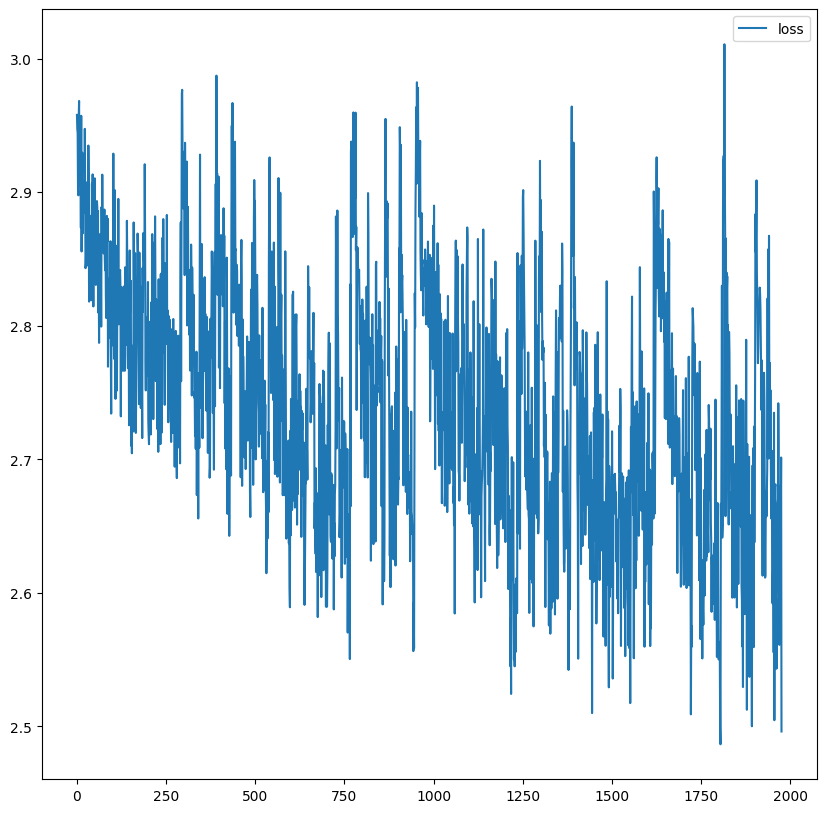

In [15]:
plt.figure(figsize=(10, 10))
plt.plot(loss_hist, label='loss')
plt.legend()
plt.show()

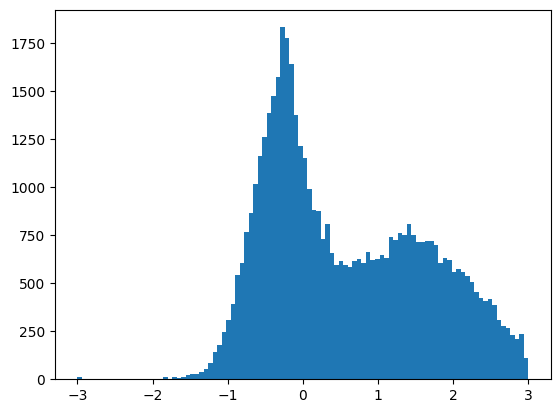

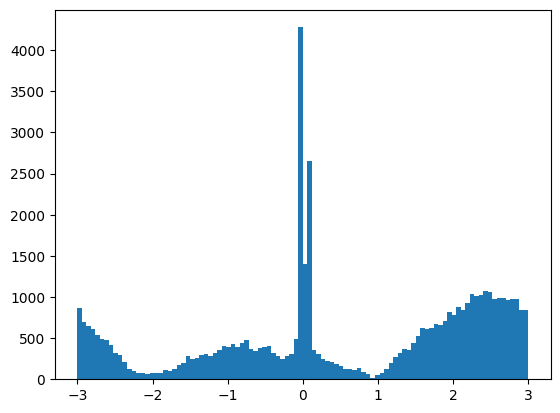

In [18]:
model.eval()
with torch.no_grad():
    s, _ = model.sample(50000)
model.train()
plt.hist(s[:, 0].cpu().data.numpy(), bins=100)
plt.show()
plt.hist(s[:, 1].cpu().data.numpy(), bins=100)
plt.show()

### Ice Flows

In [65]:
import numpy as np
import pandas as pd
from scipy.stats import t, norm
from numpy.random import default_rng

rng = default_rng(0)

def base_series(length, freq=1, seed=None):
    # série simple bruit blanc avec saisonnalité faible (ex: monthly -> freq=12)
    t = np.arange(length)
    seasonal = 0.5*np.sin(2*np.pi*t/12)  # exemple saisonnier monthly
    noise = rng.normal(scale=1.0, size=length)
    return pd.Series(seasonal + noise, index=t)

def add_trend(x, slope=0.0, t0=None, slope_after=None):
    t = np.array(x.index.year - x.index[0].year)
    trend = slope * t
    if t0 is not None and slope_after is not None:
        trend = np.where(t < t0, slope*t, slope*t0 + slope_after*(t-t0))
    return x + trend

def change_variance(x, factor_before=1.0, factor_after=2.0, t0=None):
    t = np.array(x.index.year)
    sigma = np.where(t < (t0 or 0), factor_before, factor_after)
    noise = rng.normal(scale=sigma, size=len(x))
    base = x - x.values  # zero, we will replace noise on top of deterministic part
    return x + noise  # keep deterministic part from x and add new noise

def ar_generate(length, ar_coefs, sigma=1.0):
    p = len(ar_coefs)
    y = np.zeros(length)
    eps = rng.normal(scale=sigma, size=length)
    for t in range(p, length):
        y[t] = np.dot(ar_coefs, y[t-p:t][::-1]) + eps[t]
    return pd.Series(y, index=np.arange(length))

def heteroscedastic_noise(length, base_sigma=1.0, slope=0.01):
    t = np.arange(length)
    sigma = base_sigma * (1 + slope * t)
    return rng.normal(scale=sigma)

def add_jumps(x, jump_rate=0.01, jump_scale=5.0):
    # jump_rate = prob de saut par pas
    n = len(x)
    jumps = rng.random(n) < jump_rate
    magnitudes = rng.normal(scale=jump_scale, size=n) * jumps
    return x + magnitudes

def heavy_t_innovations(length, df=3, scale=1.0):
    return t.rvs(df, size=length, random_state=rng) * scale


In [22]:
# longueur: monthly from 1980..2100 => 121 years * 12 = 1452
length = 1452
t0_change = (2020-1980)*12  # index where future begins

# base historical-like
base = base_series(length, freq=12)

# scenario: increased trend after 2020, higher variance, AR change, more extreme events
s1 = add_trend(base, slope=0.0, t0=t0_change, slope_after=0.05)          # accélération du déclin
s2 = change_variance(s1, factor_before=1.0, factor_after=2.0, t0=t0_change)
s3 = add_jumps(s2, jump_rate=0.02, jump_scale=3.0)
# remplacer innovations par AR(1) with different coef
ar_pre = 0.6
ar_post = 0.2
y = np.zeros(length)
eps = rng.normal(size=length)
for t in range(1, length):
    phi = ar_pre if t < t0_change else ar_post
    y[t] = phi*y[t-1] + (s3.values[t] - s3.values[t-1]) + eps[t]* (2.0 if t>=t0_change else 1.0)
synthetic = pd.Series(y, index=np.arange(length))


<Axes: >

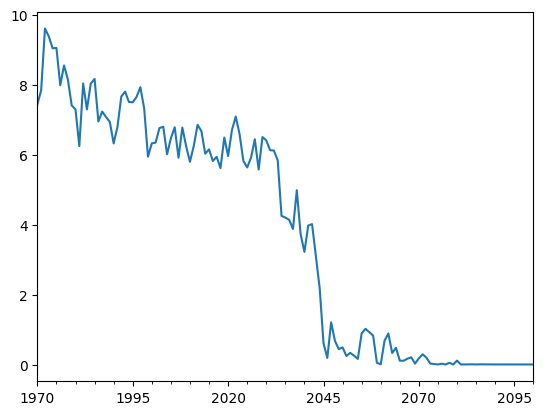

In [39]:
s = model_data["ssie"]["EC-Earth3"][0].interpolate()
s.plot()

<Axes: >

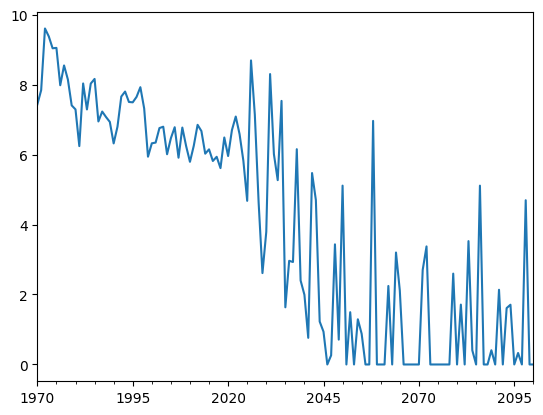

In [67]:
s1 = change_variance(s, factor_before=0, factor_after=2, t0=2025).clip(0)
s1.plot()  

Index([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,
       ...
       121, 122, 123, 124, 125, 126, 127, 128, 129, 130],
      dtype='int32', length=131)

## Gaussian Processes

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, WhiteKernel, DotProduct, RationalQuadratic, Exponentiation, Matern


train_split = 0.8
y_var = "ssie"
x_vars = ['tas', 'wsiv', 'oht_atl', 'oht_pac']


# model_name = "ACCESS-ESM1-5" # ['EC-Earth3', 'CESM2', 'MPI-ESM1-2-LR', 'CanESM5', 'ACCESS-ESM1-5']
start_year = 1970
end_year_emul = 2100


train_params = TrainParams(
    y_var=y_var,
    x_vars=x_vars,
    train_split=train_split,
)


model_name = "EC-Earth3"

end_year = model_ensemble_icefree_years[model_name].min().year
start_year_emul = end_year + 1

X = get_x(model_name, x_vars, start_year, end_year)

train_ensembles, test_ensembles = get_train_test_ensembles(X.shape[-1], train_split)

X_train, X_test = get_x_train_test(X, x_vars, train_ensembles, test_ensembles)
y_train, y_test = get_y_train_test(y_var, model_name, start_year, end_year, train_ensembles, test_ensembles)

# scaler = StandardScaler()
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.fit_transform(X_test)


In [26]:
from sklearn.gaussian_process.kernels import ConstantKernel, RBF, WhiteKernel
# kernel = (
#     # C(1.0, (1e-3, 1e3))
#     # + RBF(20.0, (1.0, 200.0))
#     # + DotProduct(sigma_0=0)
#     # + WhiteKernel(0.2, (1e-6, 1e1))
#     DotProduct(sigma_0=0) * DotProduct(sigma_0=0)
# # )

# Good for tas
# kernel = Exponentiation(
#     C(1.0, (1e-3, 1e3)) * RBF(20.0, (1.0, 200.0)) + WhiteKernel(0.2, (1e-6, 1e1)),
#     exponent=3
# )

kernel = ConstantKernel(1.0, (1e-3, 1e3)) * RBF(
    length_scale=[1.0] * 4,  # 4 features
    length_scale_bounds=[(1e-2, 1e2)] * 4  # Individual bounds per feature
) + WhiteKernel(0.1, (1e-5, 1e1))


gpr = make_pipeline(
    GaussianProcessRegressor(kernel=kernel, alpha=1e-5, normalize_y=True, n_restarts_optimizer=5)
)

gpr.fit(X_train, y_train)

y_mean, y_std = gpr.predict(X_test, return_std=True)

y_test_preperiod = get_reshaped(y_test, X.shape[1], test_ensembles)
y_test_preperiod.index = get_datetime_index(start_year, end_year)
y_pred_preperiod = get_reshaped(y_mean, X.shape[1], test_ensembles)
y_pred_preperiod.index = get_datetime_index(start_year, end_year)
y_emul_df = get_emulated(
    x_vars, gpr,
    start_year_emul, end_year_emul,
    train_ensembles, test_ensembles,
)
y_emul_df_test = filter_by_years(model_data[y_var][model_name], start_year_emul, end_year_emul)


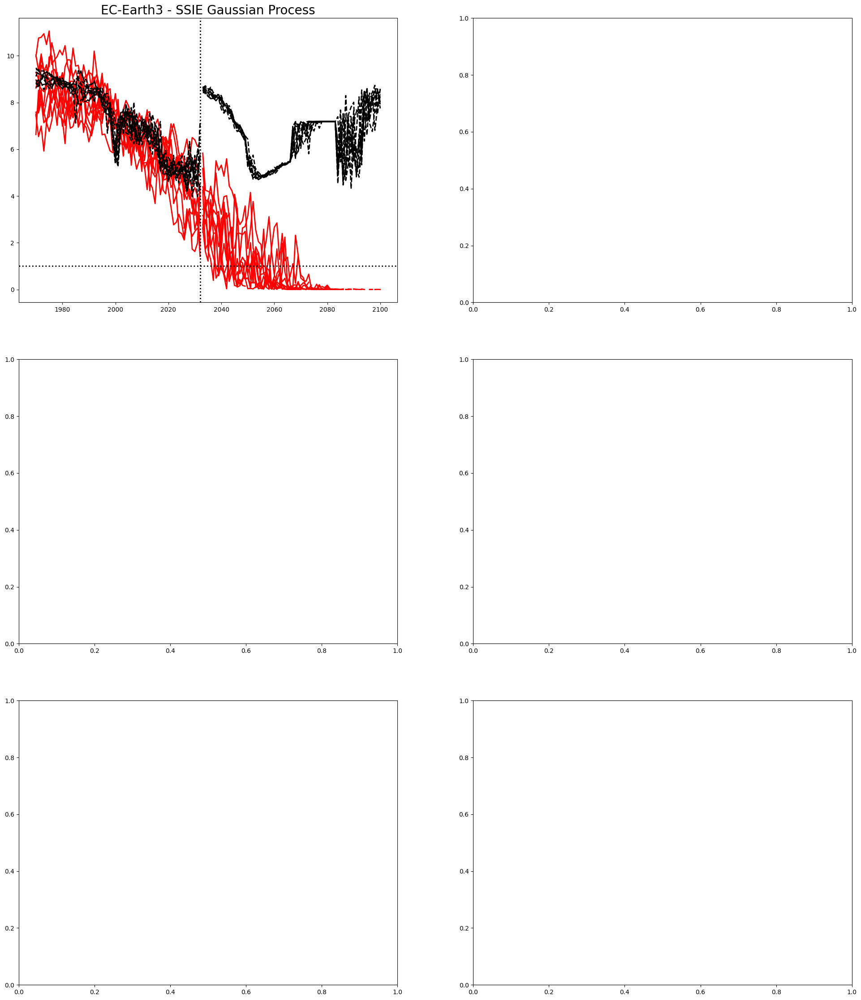

In [28]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(24, 28))

ax = axes[0][0]

_ = ax.plot(y_test_preperiod, color=MODEL_COLOURS[model_name], linewidth=2)
_ = ax.plot(y_pred_preperiod, color="black", linestyle="--", linewidth=2)

_ = ax.plot(y_emul_df_test[test_ensembles], color=MODEL_COLOURS[model_name], linewidth=2)
_ = ax.plot(y_emul_df, color="black", linestyle="--", linewidth=2)

_ = ax.axhline(y=1, color="black", linestyle=":", linewidth=2)

_ = ax.axvline(x=Timestamp(f"{end_year}-01-01"), color='black', linestyle=':', linewidth=2)

_ = ax.set_title(f"{model_name} - SSIE Gaussian Process", size=20)


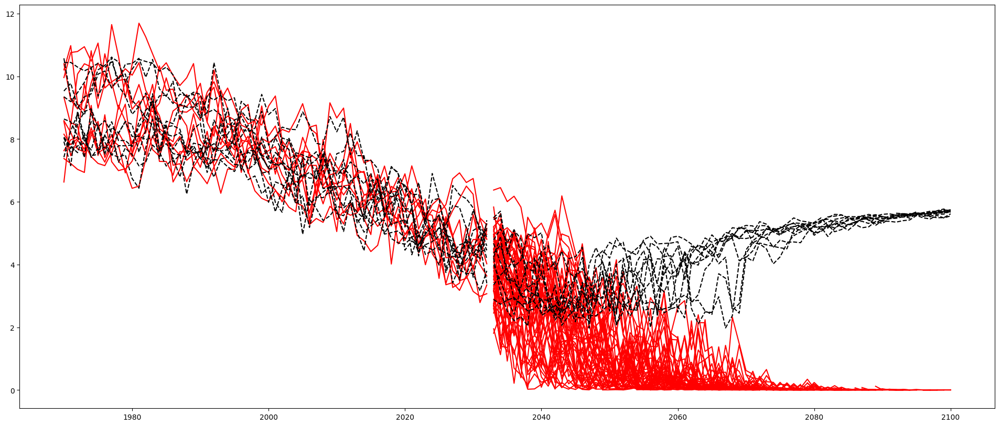

In [106]:
y_mean, y_std = gpr.predict(X_test, return_std=True)

y_test_preperiod = get_reshaped(y_test, X.shape[1], test_ensembles)
y_test_preperiod.index = get_datetime_index(start_year, end_year)
y_pred_preperiod = get_reshaped(y_mean, X.shape[1], test_ensembles)
y_pred_preperiod.index = get_datetime_index(start_year, end_year)
y_emul_df = get_emulated(
    x_vars, gpr,
    start_year_emul, end_year_emul,
    train_ensembles, test_ensembles,
)
y_emul_df_test = filter_by_years(model_data[y_var][model_name], start_year_emul, end_year_emul)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(24, 10))

_ = ax.plot(y_test_preperiod, color=MODEL_COLOURS[model_name])
_ = ax.plot(y_pred_preperiod, color="black", linestyle="--")

_ = ax.plot(y_emul_df_test, color=MODEL_COLOURS[model_name])
_ = ax.plot(y_emul_df, color="black", linestyle="--")

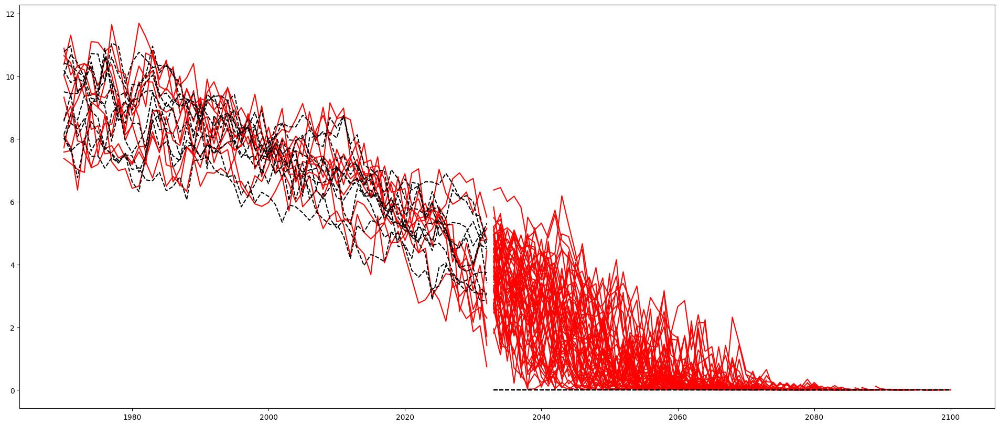

In [92]:
y_emul_df

,5,8,9,12,28,30,33,34,35,47
2033-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2034-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2035-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2036-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2037-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
2096-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2097-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2098-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2099-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [56]:
X_emul_filtered = get_x(model_name, x_vars, start_year_emul, end_year_emul)
_, X_emul = get_x_train_test(X_emul_filtered, x_vars, train_ensembles, test_ensembles)



In [63]:
DataFrame(X_emul_filtered.squeeze())

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
0,-11.401203,-8.821704,-10.040032,-10.828158,-9.996077,-9.257245,-9.753067,-9.608885,-10.214750,-11.042309,...,-8.825872,-9.308596,-11.423384,-9.625457,-10.286619,-9.688307,-8.536521,-9.445058,-10.033812,-10.494974
1,-11.106215,-9.075080,-11.287175,-11.276589,-9.221597,-8.448599,-9.751561,-9.332087,-9.155716,-10.952128,...,-7.337977,-8.419622,-11.155615,-10.482398,-10.579028,-9.990824,-7.958161,-9.505677,-9.152565,-9.982424
2,-10.600157,-10.146368,-10.450178,-10.192554,-8.968795,-8.168391,-10.252896,-9.362975,-10.051024,-10.766469,...,-7.666188,-9.419280,-10.062027,-9.791480,-9.585829,-9.239608,-8.316840,-9.510942,-8.824416,-9.372833
3,-10.584956,-9.634657,-11.121990,-10.465523,-7.962608,-8.002459,-9.507018,-8.912258,-9.244773,-10.619372,...,-8.288370,-9.223740,-9.657459,-9.866791,-9.399312,-10.002657,-8.426818,-9.684702,-9.991307,-9.323784
4,-10.230440,-8.729847,-10.164312,-10.102283,-7.949485,-8.119700,-9.683765,-8.581810,-9.872737,-10.650503,...,-8.259070,-8.656460,-9.814820,-9.229848,-9.186580,-10.269977,-7.829629,-8.601656,-9.983211,-8.685889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,-1.331601,-1.696340,-2.271329,0.212667,-1.141119,-1.269946,-1.744403,-2.360597,-1.462552,-2.251812,...,-0.572904,-1.266806,-1.358623,-1.746170,-1.548148,-0.231098,-0.424397,-1.562569,-1.115657,-2.579213
64,-1.289112,-0.593093,-2.159683,-0.049771,-0.682023,-1.796286,-1.181270,-1.846378,-0.688072,-1.856122,...,-0.736775,-1.899337,-1.037398,-0.855613,-1.558723,0.098099,-0.668011,-1.603940,-0.861332,-2.838209
65,-1.616503,-0.189117,-2.603636,-0.215124,-0.695391,-1.797232,-1.566461,-1.299086,-1.084541,-1.197316,...,-0.256005,-1.700514,-1.187628,-0.378122,-0.483744,-0.901787,-0.269072,-1.333328,-0.443963,-1.953874
66,-0.776549,-0.227333,-1.380670,-1.312642,-0.269026,-1.425293,-1.320584,-1.537266,-1.494653,-0.692394,...,0.064685,-1.360875,-0.871358,0.183931,0.179079,-1.237156,-1.179480,-1.141707,-0.302543,-2.612671


In [58]:
y_emul = gp.predict(X_emul)

In [ ]:

y_emul_df = get_reshaped(y_emul, X_emul_filtered.shape[1], test_ensembles)
y_emul_df.index = get_datetime_index(start_year_emul, end_year_emul)

In [ ]:
import pandas as pd

ws = [10, 50, 100, 500, 1000, 10000]

weights_all_models_df = DataFrame()

for i, model_name in enumerate(MODEL_NAMES):

    end_year = model_ensemble_icefree_years[model_name].min().year
    start_year_emul = end_year + 1

    X = get_x(model_name, x_vars, start_year, end_year)

    train_ensembles, test_ensembles = get_train_test_ensembles(X.shape[-1], train_split)

    X_train, X_test = get_x_train_test(X, x_vars, train_ensembles, test_ensembles)
    y_train, y_test = get_y_train_test(y_var, model_name, start_year, end_year, train_ensembles, test_ensembles)


    weighted_reg_res = []

    for weight in ws:
        sample_weight = np.ones(len(y_train))
        sample_weight[int(len(y_train) / 2):] = weight

        reg_res = get_regression(X_train, y_train, X_test, y_test, sample_weight)

        y_test_preperiod = get_reshaped(y_test, X.shape[1], test_ensembles)
        y_test_preperiod.index = get_datetime_index(start_year, end_year)
        y_pred_preperiod = get_reshaped(reg_res["y_pred"], X.shape[1], test_ensembles)
        y_pred_preperiod.index = get_datetime_index(start_year, end_year)

        mse_ens = mean_squared_error(
            y_test_preperiod,
            y_pred_preperiod,
        )
        filter_index = ssie_obs.index[ssie_obs.index <= y_pred_preperiod.index.max()]

        obs_df = DataFrame({col: ssie_obs for col in y_pred_preperiod.columns})
        obs_df = obs_df.loc[filter_index]

        mse_obs = mean_squared_error(
            y_pred_preperiod.loc[filter_index],
            obs_df,
        )

        weighted_reg_res.append({
            "model": model_name,
            "weight": weight,
            "coef": reg_res["model"].coef_,
            "intercept": reg_res["model"].intercept_,
            "mse_observation": mse_obs,
            "mse_ensembles": mse_ens,
        })

    weighted_df = DataFrame(weighted_reg_res)
    weights_all_models_df = pd.concat([weights_all_models_df, weighted_df])


import pandas as pd

ws = [10, 50, 100, 500, 1000, 10000]

weights_all_models_df = DataFrame()

for i, model_name in enumerate(MODEL_NAMES):

    end_year = model_ensemble_icefree_years[model_name].min().year
    start_year_emul = end_year + 1

    X = get_x(model_name, x_vars, start_year, end_year)

    train_ensembles, test_ensembles = get_train_test_ensembles(X.shape[-1], train_split)

    X_train, X_test = get_x_train_test(X, x_vars, train_ensembles, test_ensembles)
    y_train, y_test = get_y_train_test(y_var, model_name, start_year, end_year, train_ensembles, test_ensembles)


    weighted_reg_res = []

    for weight in ws:
        sample_weight = np.ones(len(y_train))
        sample_weight[int(len(y_train) / 2):] = weight

        reg_res = get_random_forest(X_train, y_train, X_test, y_test, sample_weight)

        y_test_preperiod = get_reshaped(y_test, X.shape[1], test_ensembles)
        y_test_preperiod.index = get_datetime_index(start_year, end_year)
        y_pred_preperiod = get_reshaped(reg_res["y_pred"], X.shape[1], test_ensembles)
        y_pred_preperiod.index = get_datetime_index(start_year, end_year)

        mse_ens = mean_squared_error(
            y_test_preperiod,
            y_pred_preperiod,
        )
        filter_index = ssie_obs.index[ssie_obs.index <= y_pred_preperiod.index.max()]

        obs_df = DataFrame({col: ssie_obs for col in y_pred_preperiod.columns})
        obs_df = obs_df.loc[filter_index]

        mse_obs = mean_squared_error(
            y_pred_preperiod.loc[filter_index],
            obs_df,
        )

        weighted_reg_res.append({
            "model": model_name,
            "weight": weight,
            "mse_observation": mse_obs,
            "mse_ensembles": mse_ens,
        })

    weighted_df = DataFrame(weighted_reg_res)
    weights_all_models_df = pd.concat([weights_all_models_df, weighted_df])